In [1]:
library(tidyverse)
library(nnet)
library(purrr)
library(furrr)
library(lme4)
library(ggplot2)
library(patchwork)
library(ggbeeswarm)

options(ggrepel.max.overlaps = Inf)

── Attaching packages ─────────────────────────────────────── tidyverse 1.3.2 ──
✔ ggplot2 3.4.2     ✔ purrr   0.3.4
✔ tibble  3.2.1     ✔ dplyr   1.1.2
✔ tidyr   1.2.1     ✔ stringr 1.4.1
✔ readr   2.1.2     ✔ forcats 0.5.2
── Conflicts ────────────────────────────────────────── tidyverse_conflicts() ──
✖ dplyr::filter() masks stats::filter()
✖ dplyr::lag()    masks stats::lag()
Loading required package: future

Loading required package: Matrix


Attaching package: ‘Matrix’


The following objects are masked from ‘package:tidyr’:

    expand, pack, unpack




In [2]:
# xe_obj = qs::qread('230710_xenium_sct_unimapped_cca_polar_label.qs')
xe_obj_path = '_targets/objects/xe_obj_cca_td_2s_uni'
xe_obj = qs::qread(xe_obj_path)
xe_obj@meta.data = xe_obj@meta.data %>%
mutate(predicted.polar_label = polar_label) %>%
filter(!is.na(predicted.polar_label))

xe_obj

Loading required package: SeuratObject

Loading required package: sp

Loading required package: Seurat



An object of class Seurat 
500 features across 60501 samples within 5 assays 
Active assay: SCT (100 features, 100 variable features)
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 1 dimensional reduction calculated: umap
 16 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7 fov.8 fov.1.1 fov.2.1 fov.3.1 fov.4.1 fov.5.1 fov.6.1 fov.7.1

In [3]:
# mutate(polar_label = predicted.polar_label_2s) %>% #only for manual object
# mutate(predicted.polar_label = polar_label) %>% #only for manual object

In [4]:
xe_obj@assays$SCT@meta.features %>% rownames_to_column(var = 'genes') %>% filter(genes != 'Lmx1a') %>% pull(genes)

[1] "Sorcs1"   "Lingo2"   "Cntn4"    "Tenm2"    "Sox5"     "Ptprd"   
 [7] "Robo1"    "Plcl1"    "Oxr1"     "Plxdc2"   "Plp1"     "Kirrel3" 
[13] "Mgat4c"   "Tenm3"    "Slit2"    "Nrg3"     "Hdac9"    "Col25a1" 
[19] "Ncam2"    "Rbfox1"   "Fgf13"    "Pde10a"   "Deptor"   "Alcam"   
[25] "Gria1"    "Grid2"    "Fam155a"  "Grm7"     "Agrp"     "Naaladl2"
[31] "Ntm"      "Gpc5"     "Hs3st4"   "Lef1"     "Erbb4"    "Kctd16"  
[37] "Zfhx3"    "Gtdc1"    "Pdgfra"   "Nrg1"     "Macrod2"  "Gpc6"    
[43] "Pcdh11x"  "Kcnip4"   "Brinp3"   "Cadm2"    "Pde4b"    "Fhit"    
[49] "Rgs6"     "Prkg1"    "Dlg2"     "Ptprk"    "Luzp2"    "Ptprt"   
[55] "Nxph1"    "Kcnq3"    "Lrmda"    "Dcc"      "Cntn5"    "Adarb2"  
[61] "Gabrg3"   "Rmst"     "Lrp1b"    "Trpm3"    "P3h2"     "Prr16"   
[67] "Prkca"    "Nrxn3"    "Aqp4"     "Ctnna2"   "Inpp4b"   "Sgcz"    
[73] "Fat3"     "Plcb1"    "Cacna2d3" "Bmp4"     "Tox"      "Car10"   
[79] "Nkain2"   "Galntl6"  "Slc7a11"  "Pcdh9"    "Slc1a2"   "Pdzrn3"  
[85] "Rax"      "Pomc"     "Zfp804b"  "Wwox"     "Pcdh7"    "Grm8"    
[91] "Rtl4"     "Il1rapl2" "Sgcd"     "Egfem1"   "Arhgap6"  "Immp2l"  
[97] "Cfap299"  "Htr3b"    "Csmd1"

In [5]:
xe_obj@assays$SCT@meta.features %>% rownames

[1] "Sorcs1"   "Lingo2"   "Cntn4"    "Tenm2"    "Sox5"     "Ptprd"   
  [7] "Robo1"    "Plcl1"    "Oxr1"     "Plxdc2"   "Plp1"     "Kirrel3" 
 [13] "Mgat4c"   "Tenm3"    "Slit2"    "Nrg3"     "Hdac9"    "Col25a1" 
 [19] "Ncam2"    "Rbfox1"   "Fgf13"    "Pde10a"   "Deptor"   "Alcam"   
 [25] "Gria1"    "Grid2"    "Fam155a"  "Grm7"     "Agrp"     "Naaladl2"
 [31] "Ntm"      "Gpc5"     "Hs3st4"   "Lef1"     "Erbb4"    "Kctd16"  
 [37] "Zfhx3"    "Gtdc1"    "Pdgfra"   "Nrg1"     "Macrod2"  "Gpc6"    
 [43] "Pcdh11x"  "Kcnip4"   "Brinp3"   "Cadm2"    "Pde4b"    "Fhit"    
 [49] "Rgs6"     "Prkg1"    "Dlg2"     "Ptprk"    "Luzp2"    "Ptprt"   
 [55] "Nxph1"    "Kcnq3"    "Lrmda"    "Dcc"      "Cntn5"    "Adarb2"  
 [61] "Gabrg3"   "Rmst"     "Lrp1b"    "Trpm3"    "P3h2"     "Prr16"   
 [67] "Prkca"    "Nrxn3"    "Aqp4"     "Ctnna2"   "Inpp4b"   "Sgcz"    
 [73] "Fat3"     "Plcb1"    "Cacna2d3" "Bmp4"     "Tox"      "Car10"   
 [79] "Nkain2"   "Galntl6"  "Slc7a11"  "Pcdh9"    "Slc1a2"   "Pdzrn3"  
 [85] "Rax"      "Pomc"     "Zfp804b"  "Wwox"     "Pcdh7"    "Grm8"    
 [91] "Rtl4"     "Il1rapl2" "Sgcd"     "Egfem1"   "Arhgap6"  "Immp2l"  
 [97] "Cfap299"  "Htr3b"    "Csmd1"    "Lmx1a"

In [6]:
xe_obj %>% `[[` %>% pull(predicted.polar_label) %>% unique

[1] "Tmem215.none"                    "Slc17a6_Trhr.none"              
 [3] "Pomc_Lepr.none"                  "Unassigned2.none"               
 [5] "Tbx19.none"                      "Ghrh.none"                      
 [7] "Trh_Cxcl12.none"                 "Nr5a1_Bdnf.none"                
 [9] "Kisspeptin.none"                 "Gm8773_Tac1__Hdc.none"          
[11] "Rgs16_Dlx1__Unassigned2.none"    "Unassigned1.sc17.sc28.none"     
[13] "Rgs16_Nmu.none"                  "Slc17a6_Fam19a2.none"           
[15] "Unassigned1.sc39.none"           "Unassigned1.sc37.none"          
[17] "Nr5a1_Nfib.none"                 "Htr3b.none"                     
[19] "Sst_Pthlh.sc21.none"             "Sst_Pthlh__Ghrh.none"           
[21] "Agrp.none"                       "Th_Nfib__Arx_Nr5a2.none"        
[23] "Trh_Lef1.none"                   "Nr5a1_Bdnf__Unassigned1.none"   
[25] "Oxt__Unassigned1.none"           "Pomc_Glipr1__Slc17a6_Trhr.none" 
[27] "Qrfp.none"                       "Nr5a1_Bdnf__Nr5a1_Nfib.none"    
[29] "Sst_Pthlh.sc23.none"             "Trh_Lef1.pos"                   
[31] "Sst_Unc13c__Agrp.none"           "Sst_Nts.none"                   
[33] "Rgs16_Dlx1.none"                 "Gpr50.none"                     
[35] "Agrp.pos"                        "Nfix_Htr2c.none"                
[37] "Htr3b.neg"                       "Agrp.neg"                       
[39] "Unassigned2__Unassigned1.none"   "Sst_Pthlh.sc23.pos"             
[41] "Th_Slc6a3.none"                  "Trh_Lef1.neg"                   
[43] "Htr3b.pos"                       "Sst_Unc13c__Agrp.neg"           
[45] "Unassigned1.sc17.sc28.pos"       "Sst_Unc13c__Agrp.pos"           
[47] "a1_Tany__Astrocytes.none"        "Astrocytes.neg"                 
[49] "NG2_OPC2.none"                   "a2_Tanycytes.none"              
[51] "MOL.pos"                         "NG2_OPC2.neg"                   
[53] "a2_Tanycytes__b1_Tanycytes.none" "Astrocytes.none"                
[55] "Astrocytes.pos"                  "NG2_OPC2.pos"                   
[57] "b1_Tanycytes.none"               "NFOL.pos"                       
[59] "a1_Tany__Astrocytes.pos"         "Endothelial.none"               
[61] "MOL.none"                        "b2_Tany.none"                   
[63] "NG2_OPC2__Microglia.none"        "Fibroblasts2__Fibroblasts3.none"
[65] "Epend.none"                      "Microglia.none"                 
[67] "Parstuber2A__ParsTuber1.none"    "Mural_Cells2.none"              
[69] "b1_Tanycytes.neg"                "a2_Tanycytes.pos"               
[71] "a1_Tany__Astrocytes.neg"         "MOL.neg"                        
[73] "b1_Tanycytes.pos"

In [7]:
xe_obj %>%
`[[` %>%
rownames %>% length

[1] 60501

In [8]:
xe_obj@meta.data %>% colnames

[1] "orig.ident"                       "nCount_Xenium"                   
 [3] "nFeature_Xenium"                  "nCount_BlankCodeword"            
 [5] "nFeature_BlankCodeword"           "nCount_ControlCodeword"          
 [7] "nFeature_ControlCodeword"         "nCount_ControlProbe"             
 [9] "nFeature_ControlProbe"            "cell_area"                       
[11] "density"                          "elongation"                      
[13] "avg_confidence"                   "nucleus_area"                    
[15] "sample_name"                      "treatment"                       
[17] "strain"                           "time"                            
[19] "nCount_SCT"                       "nFeature_SCT"                    
[21] "cell_class"                       "cell_class_prediction.score.max" 
[23] "polar_label"                      "polar_label_prediction.score.max"
[25] "labels"                           "labels_prediction.score.max"     
[27] "predicted.polar_label"

In [9]:
meta = xe_obj@meta.data

In [10]:
summary_df = xe_obj %>% 
`[[` %>%
group_by(treatment, predicted.polar_label) %>%
summarise(n = n()) %>%
pivot_wider(names_from = treatment, values_from = n) %>%
mutate(predicted.label = predicted.polar_label %>% str_replace(fixed('.neg'), '') %>% str_replace(fixed('.none'), '') %>% str_replace(fixed('.pos'), '')) %>%
rowwise %>%
mutate(polarity = str_split(predicted.polar_label, fixed('.')) %>% unlist %>% `[[`(2)) %>%
ungroup %>%
group_by(predicted.label) %>%
mutate(FGF1_label_count = sum(FGF1)) %>%
mutate(VehPF_label_count = sum(Veh_PF)) %>%
mutate(label_diff = FGF1_label_count-VehPF_label_count) %>%
mutate(label_diff_frac = label_diff/VehPF_label_count) %>%
mutate(FGF1_minus_VehPF_polar = FGF1 - Veh_PF) %>%
relocate(FGF1_minus_VehPF_polar, .after='Veh_PF') %>%
ungroup %>%
mutate(sum_FGF1_all = sum(FGF1, na.rm = TRUE)) %>%
mutate(sum_VehPF_all = sum(Veh_PF, na.rm=TRUE)) %>%
mutate(FGF1_minus_VehPF_all = sum_FGF1_all - sum_VehPF_all) %>%
arrange(desc(abs(label_diff)))


summary_df

`summarise()` has grouped output by 'treatment'. You can override using the
`.groups` argument.


predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Unassigned2.none,3504,4055,-551,Unassigned2,none,3504,4055,-551,-0.13588163,29478,31023,-1545
Nr5a1_Bdnf.none,5292,5496,-204,Nr5a1_Bdnf,none,5292,5496,-204,-0.03711790,29478,31023,-1545
Rgs16_Nmu.none,725,913,-188,Rgs16_Nmu,none,725,913,-188,-0.20591457,29478,31023,-1545
NFOL.pos,259,117,142,NFOL,pos,259,117,142,1.21367521,29478,31023,-1545
Nr5a1_Bdnf__Unassigned1.none,438,561,-123,Nr5a1_Bdnf__Unassigned1,none,438,561,-123,-0.21925134,29478,31023,-1545
Agrp.neg,188,329,-141,Agrp,neg,983,1103,-120,-0.10879420,29478,31023,-1545
Agrp.none,782,761,21,Agrp,none,983,1103,-120,-0.10879420,29478,31023,-1545
Agrp.pos,13,13,0,Agrp,pos,983,1103,-120,-0.10879420,29478,31023,-1545
Htr3b.neg,72,79,-7,Htr3b,neg,603,701,-98,-0.13980029,29478,31023,-1545


In [11]:
summary_df %>% filter(str_detect(predicted.polar_label,'Trh_Lef1'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Trh_Lef1.neg,27,39,-12,Trh_Lef1,neg,353,405,-52,-0.1283951,29478,31023,-1545
Trh_Lef1.none,273,288,-15,Trh_Lef1,none,353,405,-52,-0.1283951,29478,31023,-1545
Trh_Lef1.pos,53,78,-25,Trh_Lef1,pos,353,405,-52,-0.1283951,29478,31023,-1545


In [12]:
summary_df %>% filter(str_detect(predicted.polar_label,'MOL'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
MOL.neg,16,18,-2,MOL,neg,1222,1256,-34,-0.02707006,29478,31023,-1545
MOL.none,602,691,-89,MOL,none,1222,1256,-34,-0.02707006,29478,31023,-1545
MOL.pos,604,547,57,MOL,pos,1222,1256,-34,-0.02707006,29478,31023,-1545


In [13]:
summary_df %>% filter(str_detect(predicted.polar_label,'NG2_OPC2'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
NG2_OPC2.neg,105,131,-26,NG2_OPC2,neg,851,889,-38,-0.04274466,29478,31023,-1545
NG2_OPC2.none,635,649,-14,NG2_OPC2,none,851,889,-38,-0.04274466,29478,31023,-1545
NG2_OPC2.pos,111,109,2,NG2_OPC2,pos,851,889,-38,-0.04274466,29478,31023,-1545
NG2_OPC2__Microglia.none,267,274,-7,NG2_OPC2__Microglia,none,267,274,-7,-0.02554745,29478,31023,-1545


In [14]:
summary_df %>% filter(str_detect(predicted.polar_label,'Agrp'))

predicted.polar_label,FGF1,Veh_PF,FGF1_minus_VehPF_polar,predicted.label,polarity,FGF1_label_count,VehPF_label_count,label_diff,label_diff_frac,sum_FGF1_all,sum_VehPF_all,FGF1_minus_VehPF_all
<chr>,<int>,<int>,<int>,<chr>,<chr>,<int>,<int>,<int>,<dbl>,<int>,<int>,<int>
Agrp.neg,188,329,-141,Agrp,neg,983,1103,-120,-0.1087942,29478,31023,-1545
Agrp.none,782,761,21,Agrp,none,983,1103,-120,-0.1087942,29478,31023,-1545
Agrp.pos,13,13,0,Agrp,pos,983,1103,-120,-0.1087942,29478,31023,-1545
Sst_Unc13c__Agrp.neg,7,8,-1,Sst_Unc13c__Agrp,neg,299,NA,NA,NA,29478,31023,-1545
Sst_Unc13c__Agrp.none,289,278,11,Sst_Unc13c__Agrp,none,299,NA,NA,NA,29478,31023,-1545
Sst_Unc13c__Agrp.pos,3,NA,NA,Sst_Unc13c__Agrp,pos,299,NA,NA,NA,29478,31023,-1545


In [15]:
comparison_df = xe_obj %>% 
`[[` %>%
rownames_to_column(var = 'cell') %>%
dplyr::select(cell, sample_name, treatment, predicted.polar_label) %>%
rowwise %>%
mutate(label = predicted.polar_label %>% str_replace("\\.(pos|neg|none)$", ''),
       polarity = predicted.polar_label %>% str_split(fixed('.')) %>% unlist %>% last) %>%
mutate(treatment = factor(treatment, levels=c('Veh_PF', 'FGF1'))) %>%
mutate(polarity = factor(polarity, levels = c('none', 'neg', 'pos'))) %>% 
group_by(sample_name) %>%
mutate(sample_cell_count = n()) %>%
group_by(sample_name, label) %>%
mutate(sample_label_cell_count = n()) %>%
ungroup

comparison_df %>% print

# A tibble: 60,501 × 8
   cell               sample_name treatment predicted.polar_label label polarity
   <chr>              <chr>       <fct>     <chr>                 <chr> <fct>   
 1 Cell10000_9129_13… A1          Veh_PF    Tmem215.none          Tmem… none    
 2 Cell10001_7423_16… A1          Veh_PF    Slc17a6_Trhr.none     Slc1… none    
 3 Cell10002_2432_23… A1          Veh_PF    Pomc_Lepr.none        Pomc… none    
 4 Cell10004_9190_60… A1          Veh_PF    Unassigned2.none      Unas… none    
 5 Cell10006_3751_14… A1          Veh_PF    Tbx19.none            Tbx19 none    
 6 Cell10008_4292_32… A1          Veh_PF    Ghrh.none             Ghrh  none    
 7 Cell1000_5663_268… A1          Veh_PF    Tbx19.none            Tbx19 none    
 8 Cell10016_8010_96… A1          Veh_PF    Unassigned2.none      Unas… none    
 9 Cell10019_6171_75… A1          Veh_PF    Trh_Cxcl12.none       Trh_… none    
10 Cell10020_7108_16… A1          Veh_PF    Nr5a1_Bdnf.none       Nr5a… none    
# ℹ 6

In [16]:
comparison_df %>% group_by(label) %>% summarise(polarities = list(polarity %>% droplevels %>% levels))

label,polarities
<chr>,<list>
Agrp,"none, neg , pos"
Astrocytes,"none, neg , pos"
Endothelial,none
Epend,none
Fibroblasts2__Fibroblasts3,none
Ghrh,none
Gm8773_Tac1__Hdc,none
Gpr50,none
Htr3b,"none, neg , pos"


In [17]:
df = comparison_df %>% filter(label == 'MOL') %>%
mutate(polarity = polarity %>% relevel(ref = 'none')) %>%
mutate(polarity =  polarity %>% droplevels)
df %>% print

# A tibble: 2,478 × 8
   cell               sample_name treatment predicted.polar_label label polarity
   <chr>              <chr>       <fct>     <chr>                 <chr> <fct>   
 1 Cell1001_7582_755… A1          Veh_PF    MOL.pos               MOL   pos     
 2 Cell10189_7738_41… A1          Veh_PF    MOL.none              MOL   none    
 3 Cell10207_4078_55… A1          Veh_PF    MOL.none              MOL   none    
 4 Cell1025_4270_414… A1          Veh_PF    MOL.pos               MOL   pos     
 5 Cell10564_3209_42… A1          Veh_PF    MOL.none              MOL   none    
 6 Cell10654_7388_59… A1          Veh_PF    MOL.none              MOL   none    
 7 Cell10704_10469_1… A1          Veh_PF    MOL.none              MOL   none    
 8 Cell1078_7267_128… A1          Veh_PF    MOL.none              MOL   none    
 9 Cell10857_2337_76… A1          Veh_PF    MOL.none              MOL   none    
10 Cell10957_4996_10… A1          Veh_PF    MOL.none              MOL   none    
# ℹ 2,

In [18]:
make_input_df = function(comparison_df_chunk){
    input_df = comparison_df_chunk %>%
        mutate(polarity = polarity %>% relevel(ref = 'none')) %>%
        mutate(polarity =  polarity %>% droplevels)
    input_df
}

In [19]:
fit_multinom = function(input_df){
    # Fit the multinomial logistic regression model
    model <- multinom(polarity ~ treatment + sample_name, data = input_df)
#     model <- multinom(polarity ~ treatment, data = input_df)
    model
}

In [20]:
get_multinom_coef = function(model){
    coefs = summary(model)$coefficients
    coefs
}

get_multinom_zvalues = function(model){
    zvalues = summary(model)$coefficients / summary(model)$standard.errors
    zvalues
}

get_multinom_pvalues = function(zvalues){
    pvalues = 2 * (1 - pnorm(abs(zvalues)))
    pvalues
}



In [21]:
.get_results_long_to_wide_df = function(results, polarity_name, value.type){
    results_df = results %>% as.data.frame %>%
    set_names(polarity_name) %>%
#     set_names(input_df %>% pull(polarity) %>% levels %>% last) %>% 
    t %>% as.data.frame %>%
    mutate(value_type = value.type) %>%
    rownames_to_column %>%
    relocate(value_type, .after='polarity')
    results_df
}

In [22]:
.get_results_already_wide_df = function(results, value.type){
    results_df = results %>% 
    as.data.frame %>%
    rownames_to_column(var = 'polarity') %>%
    mutate(value_type = value.type) %>%
    relocate(value_type, .after='polarity')
    results_df
}

In [23]:
make_multinom_results_df = function(df){
    input_df = make_input_df(df)
    model = fit_multinom(input_df)
    zvalues = model %>% get_multinom_zvalues
    pvalues = zvalues %>% get_multinom_pvalues
    coefs = model %>% get_multinom_coef
    polarity_levels = input_df %>% pull(polarity) %>% levels
    if (length(polarity_levels) > 2){
        zvalues_df = .get_results_already_wide_df(zvalues, 'zvalue')
        pvalues_df = .get_results_already_wide_df(pvalues, 'pvalue')
        coefs_df = .get_results_already_wide_df(coefs, 'coef')
    } else {
        polarity_name = polarity_levels %>% last
        zvalues_df = .get_results_long_to_wide_df(zvalues, polarity_name, 'zvalue')
        pvalues_df = .get_results_long_to_wide_df(pvalues, polarity_name, 'pvalue')
        coefs_df = .get_results_long_to_wide_df(coefs, polarity_name, 'pvalue')
    }
    results_df = rbind(pvalues_df, zvalues_df, coefs_df) %>%
    mutate(label = input_df %>% distinct(label) %>% pull) %>%
    relocate(label)
    results_df
}

In [24]:
make_multinom_results_df_safe = function(df){
    results_df = tryCatch(
        make_multinom_results_df(df),
        error = function(e) data.frame()
    )
    results_df
}

In [25]:
#no idea why I removed this
# comparison_df_f = comparison_df %>%
# filter(!(sample_name == 'D2' & label == 'Agrp'))

# entire comparison_df
comparison_df_f = comparison_df 

In [26]:
#no idea why I removed this
# comparison_df_f = comparison_df %>%
# filter(!(sample_name == 'C2' & label == 'Rgs16_Dlx1'))
comparison_df_f = comparison_df 
# entire comparison_df


In [27]:
# Group the dataframe by label and fit glmer model in parallel
results_df_list <- comparison_df_f %>%
  group_split(label) %>%
  map(function(subset) {
      result_list = subset %>% make_multinom_results_df_safe
      result_list
  })

results_df = results_df_list %>% bind_rows


# weights:  30 (18 variable)
initial  value 2291.705234 
iter  10 value 1305.670014
iter  20 value 1269.624145
final  value 1269.064755 
converged
# weights:  30 (18 variable)
initial  value 3931.933381 
iter  10 value 2171.250021
iter  20 value 2150.553971
final  value 2150.453447 
converged
# weights:  30 (18 variable)
initial  value 1432.590424 
iter  10 value 643.358119
iter  20 value 636.850079
final  value 636.841716 
converged
# weights:  30 (18 variable)
initial  value 2722.361251 
iter  10 value 1872.991560
iter  20 value 1847.351804
final  value 1847.314234 
converged
# weights:  30 (18 variable)
initial  value 1911.585382 
iter  10 value 1320.384705
iter  20 value 1310.723216
final  value 1310.649103 
converged
# weights:  10 (9 variable)
initial  value 389.548715 
iter  10 value 125.014037
iter  20 value 124.838367
iter  20 value 124.838367
final  value 124.838367 
converged
# weights:  30 (18 variable)
initial  value 642.688189 
iter  10 value 80.104722
iter  20 value 79.3

In [28]:
results_df %>% head # all Agrp

,label,polarity,value_type,(Intercept),treatmentFGF1,sample_nameA2,sample_nameB1,sample_nameB2,sample_nameC1,sample_nameC2,sample_nameD1,sample_nameD2
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Agrp,neg,pvalue,1.410092e-08,8.063255e-09,0.007411077,0.1049674,0.06746407,6.949945e-01,3.074895e-01,2.097935e-01,9.915401e-05
2,Agrp,pos,pvalue,2.220446e-16,1.110223e-15,0.270800636,0.3942206,0.73104300,0.000000e+00,3.370326e-11,1.110223e-15,0.000000e+00
3,Agrp,neg,zvalue,-5.672159e+00,-5.767131e+00,-2.677785008,-1.6212343,-1.82856986,-3.920862e-01,1.020504e+00,-1.254134e+00,-3.892653e+00
4,Agrp,pos,zvalue,-8.196742e+00,-8.022648e+00,1.101220652,-0.8519882,-0.34373843,-4.417717e+09,6.629410e+00,8.013883e+00,1.083088e+01
5,Agrp,neg,coef,-6.047969e-01,-6.258552e-01,-0.488333734,-0.2931401,-0.32951266,-5.582287e-02,1.708814e-01,-1.636770e-01,-5.772368e-01
6,Agrp,pos,coef,-4.131158e+00,-3.586099e+00,0.718902752,-0.9564194,-0.29965788,-1.510518e+01,3.795288e+00,3.582099e+00,4.141696e+00


In [29]:
results_df %>% head #no A1 Agrp

,label,polarity,value_type,(Intercept),treatmentFGF1,sample_nameA2,sample_nameB1,sample_nameB2,sample_nameC1,sample_nameC2,sample_nameD1,sample_nameD2
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Agrp,neg,pvalue,1.410092e-08,8.063255e-09,0.007411077,0.1049674,0.06746407,6.949945e-01,3.074895e-01,2.097935e-01,9.915401e-05
2,Agrp,pos,pvalue,2.220446e-16,1.110223e-15,0.270800636,0.3942206,0.73104300,0.000000e+00,3.370326e-11,1.110223e-15,0.000000e+00
3,Agrp,neg,zvalue,-5.672159e+00,-5.767131e+00,-2.677785008,-1.6212343,-1.82856986,-3.920862e-01,1.020504e+00,-1.254134e+00,-3.892653e+00
4,Agrp,pos,zvalue,-8.196742e+00,-8.022648e+00,1.101220652,-0.8519882,-0.34373843,-4.417717e+09,6.629410e+00,8.013883e+00,1.083088e+01
5,Agrp,neg,coef,-6.047969e-01,-6.258552e-01,-0.488333734,-0.2931401,-0.32951266,-5.582287e-02,1.708814e-01,-1.636770e-01,-5.772368e-01
6,Agrp,pos,coef,-4.131158e+00,-3.586099e+00,0.718902752,-0.9564194,-0.29965788,-1.510518e+01,3.795288e+00,3.582099e+00,4.141696e+00


In [30]:
results_df %>% head #no D2 Agrp

,label,polarity,value_type,(Intercept),treatmentFGF1,sample_nameA2,sample_nameB1,sample_nameB2,sample_nameC1,sample_nameC2,sample_nameD1,sample_nameD2
,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
1,Agrp,neg,pvalue,1.410092e-08,8.063255e-09,0.007411077,0.1049674,0.06746407,6.949945e-01,3.074895e-01,2.097935e-01,9.915401e-05
2,Agrp,pos,pvalue,2.220446e-16,1.110223e-15,0.270800636,0.3942206,0.73104300,0.000000e+00,3.370326e-11,1.110223e-15,0.000000e+00
3,Agrp,neg,zvalue,-5.672159e+00,-5.767131e+00,-2.677785008,-1.6212343,-1.82856986,-3.920862e-01,1.020504e+00,-1.254134e+00,-3.892653e+00
4,Agrp,pos,zvalue,-8.196742e+00,-8.022648e+00,1.101220652,-0.8519882,-0.34373843,-4.417717e+09,6.629410e+00,8.013883e+00,1.083088e+01
5,Agrp,neg,coef,-6.047969e-01,-6.258552e-01,-0.488333734,-0.2931401,-0.32951266,-5.582287e-02,1.708814e-01,-1.636770e-01,-5.772368e-01
6,Agrp,pos,coef,-4.131158e+00,-3.586099e+00,0.718902752,-0.9564194,-0.29965788,-1.510518e+01,3.795288e+00,3.582099e+00,4.141696e+00


In [31]:
polarity_sig_df = results_df %>% 
select(label, polarity, treatmentFGF1, value_type) %>% distinct %>%
# group_by(label, polarity) %>%
pivot_wider(names_from = 'value_type', values_from = 'treatmentFGF1') %>%
rename(pval = pvalue, z = zvalue) %>%
ungroup %>%
mutate(pval_corrected = p.adjust(pval, method = "BH")) %>%
arrange(label) %>% 
mutate(significant = case_when(pval < 0.05 ~ '**',
                                TRUE ~ '')) %>%
mutate(significant_adj = case_when(pval_corrected < 0.05 ~ '**',
                               TRUE ~ '')) %>%
relocate(pval, coef, z, significant, significant_adj, .after='polarity') %>%
mutate(z = case_when(abs(z) > 8 ~ sign(z)*8,
                     TRUE ~ z))

polarity_sig_df

label,polarity,pval,coef,z,significant,significant_adj,pval_corrected
<chr>,<chr>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>
Agrp,neg,8.063255e-09,-0.6258552,-5.767130637,**,**,4.837953e-08
Agrp,pos,1.110223e-15,-3.5860988,-8.000000000,**,**,1.998401e-14
Astrocytes,neg,5.587371e-02,0.2041678,1.912019380,,,1.257158e-01
Astrocytes,pos,4.304365e-02,0.3792553,2.023286227,**,,1.106837e-01
Htr3b,neg,2.288789e-01,-0.2168860,-1.203251838,,,3.169092e-01
Htr3b,pos,2.230850e-01,0.5520572,1.218365886,,,3.169092e-01
MOL,neg,4.973740e-01,0.3126729,0.678627360,,,5.595458e-01
MOL,pos,1.171858e-02,0.2356658,2.520507245,**,**,4.218690e-02
NG2_OPC2,neg,7.510638e-02,-0.2788668,-1.779814152,,,1.502128e-01


In [32]:
get_glmer_pvalue = function(model){
    model_summary = summary(model)
    pvalue = model_summary %>% 
        `[[`('coefficients') %>%
        as.data.frame %>%
        dplyr::select(any_of('Pr(>|z|)')) %>%
        rownames_to_column %>%
        filter(rowname == 'treatmentFGF1') %>%
        pull('Pr(>|z|)')
    pvalue
}

get_glmer_coef = function(model){
    model_summary = summary(model)
    coef = model_summary %>% 
        `[[`('coefficients') %>%
        as.data.frame %>%
        dplyr::select(any_of('Estimate')) %>%
        rownames_to_column %>%
        filter(rowname == 'treatmentFGF1') %>%
        pull('Estimate')
    coef
}

In [33]:
make_result = function(subset){
    result_name = subset %>% distinct(label) %>% pull
    model = tryCatch(
      glmer(polarity ~ treatment + (1 | sample_name), data = subset, family = binomial),
      error = function(e) NA
    )
    pval = tryCatch(
               get_glmer_pvalue(model),
               error = function(e) 1
           )
    coef = tryCatch(
           get_glmer_coef(model),
           error = function(e) NA
       )
    result_list = list(name = result_name,
                       pval = pval,
                       coef = coef,
                       model = model)
    result_list
}

In [34]:


# Group the dataframe by label and fit glmer model in parallel
models <- comparison_df %>%
  group_split(label) %>%
  map(function(subset) {
      result_list = subset %>% make_result
      result_list
  })


boundary (singular) fit: see help('isSingular')

boundary (singular) fit: see help('isSingular')

boundary (singular) fit: see help('isSingular')

boundary (singular) fit: see help('isSingular')

boundary (singular) fit: see help('isSingular')



In [35]:


# Combine models into a tibble
result <- map_dfr(models, ~ tibble(label = .x$name, pval = .x$pval, coef = .x$coef))

# Print the result
result %>% arrange(pval)


label,pval,coef
<chr>,<dbl>,<dbl>
a1_Tany__Astrocytes,4.722644e-11,0.9115151
Agrp,1.584520e-04,-0.5237678
b1_Tanycytes,1.021007e-03,0.6510079
Astrocytes,4.856289e-02,0.1646290
MOL,1.056633e-01,0.2641598
a2_Tanycytes,1.128596e-01,-0.6002670
Trh_Lef1,2.100568e-01,-0.2794988
Sst_Pthlh.sc23,2.717531e-01,0.5292010
Htr3b,4.138981e-01,0.1277965


In [36]:
make_glmer_result_ncells = function(comparison_df, current_ct){
    comparison_df_1vr = comparison_df %>%
        mutate(test_label = case_when(label == current_ct ~ current_ct,
                                      TRUE ~ 'other')) %>%
        mutate(test_label = factor(test_label, levels=c('other', current_ct)))
    print(dim(comparison_df_1vr))
    model = tryCatch(
      glmer(test_label ~ treatment + (1 | sample_name), data = comparison_df_1vr, family = binomial),
      error = function(e) NA
    )
    pval = tryCatch(
               get_glmer_pvalue(model),
               error = function(e) 1
           )
    coef = tryCatch(
           get_glmer_coef(model),
           error = function(e) NA
       )
    result_list = list(name = current_ct,
                       pval = pval,
                       coef = coef,
                       model = model)
    result_list
}

In [37]:
make_glmer_result_ncells = function(comparison_df, current_ct){
    comparison_df_1vr = comparison_df %>%
        mutate(test_label = case_when(label == current_ct ~ current_ct,
                                      TRUE ~ 'other')) %>%
        mutate(test_label = factor(test_label, levels=c('other', current_ct)))
    print(dim(comparison_df_1vr))
    model = tryCatch(
      glmer(test_label ~ treatment + (1 | sample_name), data = comparison_df_1vr, family = binomial),
      error = function(e) NA
    )
    pval = tryCatch(
               get_glmer_pvalue(model),
               error = function(e) 1
           )
    coef = tryCatch(
           get_glmer_coef(model),
           error = function(e) NA
       )
    zscores = tryCatch(
           summary(model)$coefficients[,"z value"][[2]],
           error = function(e) NA
       )
    result_list = list(name = current_ct,
                       pval = pval,
                       coef = coef,
                       zscores = zscores,
                       model = model)
    result_list
}


In [38]:
comparison_df %>% head

cell,sample_name,treatment,predicted.polar_label,label,polarity,sample_cell_count,sample_label_cell_count
<chr>,<chr>,<fct>,<chr>,<chr>,<fct>,<int>,<int>
Cell10000_9129_13312_1,A1,Veh_PF,Tmem215.none,Tmem215,none,10783,197
Cell10001_7423_16733_1,A1,Veh_PF,Slc17a6_Trhr.none,Slc17a6_Trhr,none,10783,121
Cell10002_2432_2392_1,A1,Veh_PF,Pomc_Lepr.none,Pomc_Lepr,none,10783,245
Cell10004_9190_600_1,A1,Veh_PF,Unassigned2.none,Unassigned2,none,10783,1358
Cell10006_3751_1404_1,A1,Veh_PF,Tbx19.none,Tbx19,none,10783,75
Cell10008_4292_3239_1,A1,Veh_PF,Ghrh.none,Ghrh,none,10783,158


In [39]:
labels <- unique(comparison_df$label)

# Group the dataframe by label and fit glmer model in parallel
models = map(labels, function(current_ct) {
  results_list = make_glmer_result_ncells(comparison_df, current_ct)
  results_list
})

[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9
[1] 60501     9
[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9
[1] 60501     9
[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9
[1] 60501     9


boundary (singular) fit: see help('isSingular')



[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9
[1] 60501     9


In [40]:
sumstats_comparison = comparison_df %>% 
group_by(sample_name, treatment, label) %>% 
summarise(n=n()) %>% 
group_by(label, treatment) %>% 
summarise(median = median(n), mean=mean(n), min=min(n), max=max(n)) 

# sumstats_comparison %>% head

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.
`summarise()` has grouped output by 'label'. You can override using the
`.groups` argument.


In [41]:
sumstats_comparison %>% group_by(label) %>% summarise(max_group_median = max(median))

label,max_group_median
<chr>,<dbl>
Agrp,264.5
Astrocytes,481.5
Endothelial,21.5
Epend,49.5
Fibroblasts2__Fibroblasts3,51.0
Ghrh,110.5
Gm8773_Tac1__Hdc,64.0
Gpr50,46.0
Htr3b,171.0


In [42]:
sumstats_comparison %>% filter(label == 'NFOL')

label,treatment,median,mean,min,max
<chr>,<fct>,<dbl>,<dbl>,<int>,<int>
NFOL,Veh_PF,29.0,29.25,21,38
NFOL,FGF1,68.5,64.75,42,80


In [43]:
sumstats_comparison %>% filter(label == 'Trh_Lef1')

label,treatment,median,mean,min,max
<chr>,<fct>,<dbl>,<dbl>,<int>,<int>
Trh_Lef1,Veh_PF,96.0,101.25,70,143
Trh_Lef1,FGF1,93.5,88.25,49,117


In [44]:
# Combine models into a tibble
ncells_result <- map_dfr(models, ~ tibble(label = .x$name, pval = .x$pval, coef = .x$coef, zscore = .x$zscores))


# Print the result
ncells_sig_df = ncells_result %>% 
arrange(pval) %>% 
mutate(pval_corrected = p.adjust(pval, method = "BH")) %>%
mutate(significant = case_when(pval < 0.05 ~ '**',
                               TRUE ~ '')) %>%
mutate(significant_adj = case_when(pval_corrected < 0.05 ~ '**',
                               TRUE ~ ''))

ncells_sig_df %>% head(15)

label,pval,coef,zscore,pval_corrected,significant,significant_adj
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>
Rgs16_Dlx1,9.619437e-05,-0.36598967,-3.899996,0.005002107,**,**
NFOL,8.566117e-04,0.86335078,3.333823,0.022271905,**,**
Pomc_Glipr1__Slc17a6_Trhr,1.258293e-02,0.14578173,2.495360,0.196400687,**,
Sst_Pthlh__Ghrh,1.510775e-02,-0.43519803,-2.429786,0.196400687,**,
Unassigned2,3.452866e-02,-0.10426532,-2.113843,0.359098101,**,
Oxt__Unassigned1,5.747905e-02,-1.30247589,-1.899650,0.443785329,,
Microglia,7.311742e-02,0.20616093,1.792097,0.443785329,,
a1_Tany__Astrocytes,9.736746e-02,0.16334679,1.657752,0.443785329,,
Ghrh,1.039067e-01,0.14382810,1.626202,0.443785329,,


In [45]:
agg_data = comparison_df %>%
group_by(sample_name, treatment, label) %>%
summarise(cell_count = n())

agg_data %>% print

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.


# A tibble: 416 × 4
# Groups:   sample_name, treatment [8]
   sample_name treatment label                      cell_count
   <chr>       <fct>     <chr>                           <int>
 1 A1          Veh_PF    Agrp                              389
 2 A1          Veh_PF    Astrocytes                        651
 3 A1          Veh_PF    Endothelial                        29
 4 A1          Veh_PF    Epend                             120
 5 A1          Veh_PF    Fibroblasts2__Fibroblasts3         50
 6 A1          Veh_PF    Ghrh                              158
 7 A1          Veh_PF    Gm8773_Tac1__Hdc                   96
 8 A1          Veh_PF    Gpr50                              58
 9 A1          Veh_PF    Htr3b                             243
10 A1          Veh_PF    Kisspeptin                        178
# ℹ 406 more rows


In [46]:
wilcox_test_result <- wilcox.test(cell_count ~ treatment, data = agg_data)
wilcox_test_result


	Wilcoxon rank sum test with continuity correction

data:  cell_count by treatment
W = 22044, p-value = 0.7375
alternative hypothesis: true location shift is not equal to 0


In [47]:
wilcox_test_result$p.value

[1] 0.7374697

In [48]:
wilcox_test_result$statistic

W 
22043.5

In [49]:
make_result_wilcox = function(subset){
    result_name = subset %>% distinct(label) %>% pull
    pval = tryCatch(
      wilcox.test(cell_count ~ treatment, data = subset)$p.value, 
      error = function(e) NA
    )
    result_list = list(name = result_name,
                       pval = pval)
    result_list
}

In [50]:
# Set up parallel processing
# plan(multisession, workers=40)  # Adjust according to your system capabilities

# Group the dataframe by label and fit glmer model in parallel
models_wilcox <- agg_data %>% group_by(label) %>% group_split %>%
  map(function(subset) {
      result_list = subset %>% make_result_wilcox
      result_list
  })


Warning message in wilcox.test.default(x = c(29L, 19L, 13L, 13L), y = c(24L, 15L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(77L, 42L, 43L, 72L), y = c(72L, 34L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(95L, 61L, 57L, 61L), y = c(66L, 47L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(73L, 61L, 56L, 36L), y = c(37L, 31L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(132L, 181L, 192L, 56L), y = c(60L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(17L, 53L, 17L, 2L), y = c(2L, 1L, 10L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(23L, 3L, 5L, 26L), y = c(10L, 24L, :
“cannot compute exact p-value with ties”
Warning message in wilcox.test.default(x = c(77L, 73L, 57L, 79L), y = c(52L, 41L, :
“cannot compute exact p-value with ties”
Wa

In [51]:
wilcox_tibble = tibble(
  name = map_chr(models_wilcox, "name"),
  pval = map_dbl(models_wilcox, "pval")
) %>%
arrange(pval)

wilcox_tibble

name,pval
<chr>,<dbl>
NFOL,0.02857143
Rgs16_Dlx1,0.11428571
Sst_Pthlh__Ghrh,0.11428571
Oxt__Unassigned1,0.14405063
Qrfp,0.34285714
Nr5a1_Bdnf__Nr5a1_Nfib,0.38363033
Fibroblasts2__Fibroblasts3,0.48571429
Ghrh,0.48571429
Gm8773_Tac1__Hdc,0.48571429


In [52]:
xe_obj@images %>% names

[1] "fov"     "fov.1"   "fov.2"   "fov.3"   "fov.4"   "fov.5"   "fov.6"  
 [8] "fov.7"   "fov.8"   "fov.1.1" "fov.2.1" "fov.3.1" "fov.4.1" "fov.5.1"
[15] "fov.6.1" "fov.7.1"

In [53]:
xe_obj %>% `[[` %>% colnames

[1] "orig.ident"                       "nCount_Xenium"                   
 [3] "nFeature_Xenium"                  "nCount_BlankCodeword"            
 [5] "nFeature_BlankCodeword"           "nCount_ControlCodeword"          
 [7] "nFeature_ControlCodeword"         "nCount_ControlProbe"             
 [9] "nFeature_ControlProbe"            "cell_area"                       
[11] "density"                          "elongation"                      
[13] "avg_confidence"                   "nucleus_area"                    
[15] "sample_name"                      "treatment"                       
[17] "strain"                           "time"                            
[19] "nCount_SCT"                       "nFeature_SCT"                    
[21] "cell_class"                       "cell_class_prediction.score.max" 
[23] "polar_label"                      "polar_label_prediction.score.max"
[25] "labels"                           "labels_prediction.score.max"     
[27] "predicted.polar_label"

In [54]:
xe_obj %>% `[[` %>% head

,orig.ident,nCount_Xenium,nFeature_Xenium,nCount_BlankCodeword,nFeature_BlankCodeword,nCount_ControlCodeword,nFeature_ControlCodeword,nCount_ControlProbe,nFeature_ControlProbe,cell_area,⋯,time,nCount_SCT,nFeature_SCT,cell_class,cell_class_prediction.score.max,polar_label,polar_label_prediction.score.max,labels,labels_prediction.score.max,predicted.polar_label
,<chr>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,<int>,<dbl>,⋯,<chr>,<dbl>,<int>,<chr>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<chr>
Cell10000_9129_13312_1,SeuratProject,113,38,0,0,0,0,0,0,1271,⋯,obob,122,38,neuron,0.9945352,Tmem215.none,0.4069707,Tmem215,2,Tmem215.none
Cell10001_7423_16733_1,SeuratProject,31,18,0,0,0,0,0,0,467,⋯,obob,114,39,neuron,0.8872103,Slc17a6_Trhr.none,0.3399844,Slc17a6_Trhr,2,Slc17a6_Trhr.none
Cell10002_2432_2392_1,SeuratProject,62,28,0,0,0,0,0,0,1197,⋯,obob,117,28,neuron,1.0000000,Pomc_Lepr.none,0.2107426,Pomc_Lepr,2,Pomc_Lepr.none
Cell10004_9190_600_1,SeuratProject,93,35,0,0,0,0,0,0,2361,⋯,obob,120,35,neuron,1.0000000,Unassigned2.none,0.2309779,Unassigned2,2,Unassigned2.none
Cell10006_3751_1404_1,SeuratProject,240,54,0,0,0,0,0,0,3947,⋯,obob,134,47,neuron,0.6927640,Tbx19.none,0.4078065,Tbx19,2,Tbx19.none
Cell10008_4292_3239_1,SeuratProject,115,37,0,0,0,0,0,0,1989,⋯,obob,120,37,neuron,0.9703803,Ghrh.none,0.2613821,Ghrh,2,Ghrh.none


In [55]:
fov_names = xe_obj@images %>% names
centroids_df <- purrr::map_df(fov_names, function(x) GetTissueCoordinates(xe_obj@images[[x]], which='centroids')) %>%
rename(centroid_x = x, centroid_y = y)

centroids_df %>% dim
centroids_df %>% head

[1] 60501     3

,centroid_x,centroid_y,cell
,<dbl>,<dbl>,<chr>
1,9128.973,13312.496,Cell10000_9129_13312_1
2,7422.903,16732.903,Cell10001_7423_16733_1
3,2431.823,2391.548,Cell10002_2432_2392_1
4,9190.269,600.172,Cell10004_9190_600_1
5,3751.225,1404.062,Cell10006_3751_1404_1
6,4291.704,3239.043,Cell10008_4292_3239_1


In [56]:
coord_comparison_df = comparison_df %>%
merge(centroids_df, by='cell')

coord_comparison_df %>% head

,cell,sample_name,treatment,predicted.polar_label,label,polarity,sample_cell_count,sample_label_cell_count,centroid_x,centroid_y
,<chr>,<chr>,<fct>,<chr>,<chr>,<fct>,<int>,<int>,<dbl>,<dbl>
1,Cell10_3084_1358_5,C1,FGF1,a1_Tany__Astrocytes.pos,a1_Tany__Astrocytes,pos,7367,249,3083.680,1358.3820
2,Cell10_3653_787_7,D1,FGF1,a1_Tany__Astrocytes.none,a1_Tany__Astrocytes,none,8761,252,3653.241,786.5134
3,Cell100_2098_3006_8,D2,FGF1,Fibroblasts2__Fibroblasts3.none,Fibroblasts2__Fibroblasts3,none,8796,65,2097.813,3005.7761
4,Cell100_2917_2346_5,C1,FGF1,Qrfp.none,Qrfp,none,7367,50,2916.861,2345.8667
5,Cell100_3095_2417_2,A2,Veh_PF,Oxt__Unassigned1.none,Oxt__Unassigned1,none,7163,53,3095.210,2416.5618
6,Cell100_4293_1338_7,D1,FGF1,Nfix_Htr2c.none,Nfix_Htr2c,none,8761,63,4292.503,1337.6921


In [57]:
plot_single_slice_label = function(coord_comparison_df, sample, cell_type, pt_size=0.1){
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(label == cell_type ~ !!cell_type,
                                          TRUE ~ 'other'),
               polarity_factor = factor(polarity, levels = c('none', 'neg', 'pos')),
               cell_type_factor = factor(label == cell_type, levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(polarity))) %>%
        arrange(cell_type_factor, polarity_factor) %>%
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(values = c('none' =  "#DAA520",
                                        'pos' = "#2166ac",
                                        'neg' = "#b2182b",
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = setNames(c("other" = 16, "this" = 16), c("other", cell_type))) +
          scale_alpha_manual(values = setNames(c("other" = 0.1, "this" = 1), c("other", cell_type))) +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank()    # Remove y-axis labels
        )
    
    ggp
}


Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”


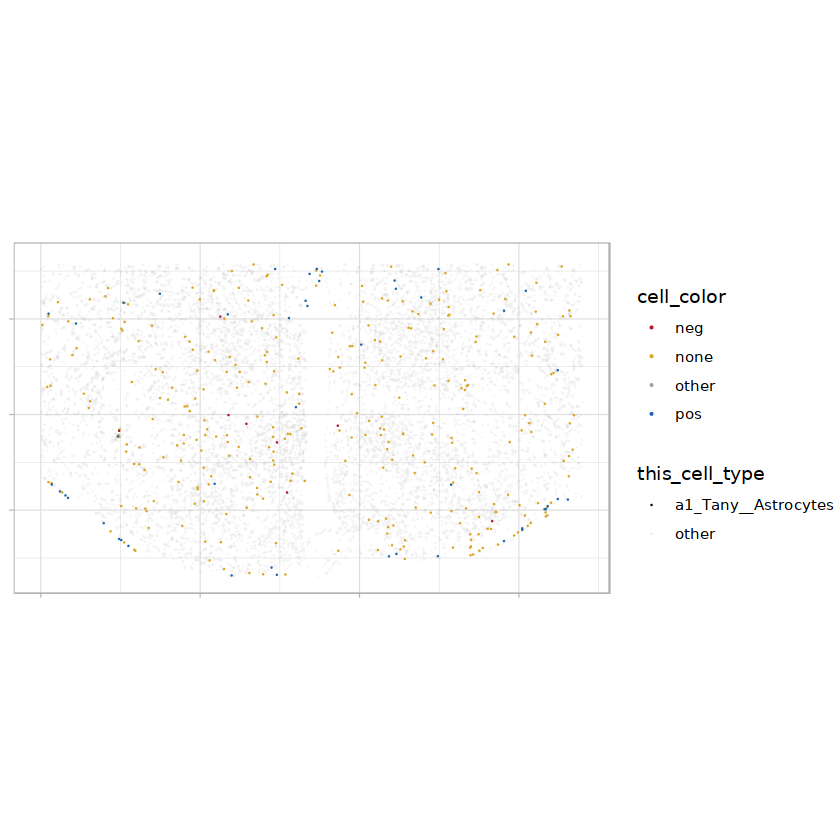

In [58]:
plot_single_slice_label(coord_comparison_df, 'A1', 'a1_Tany__Astrocytes')

In [59]:
plot_all_samples_polarity = function(coord_comparison_df, cell_type){
    p1 = plot_single_slice_label(coord_comparison_df, 'A1', cell_type)
    p2 = plot_single_slice_label(coord_comparison_df, 'A2', cell_type)
    p3 = plot_single_slice_label(coord_comparison_df, 'B1', cell_type)
    p4 = plot_single_slice_label(coord_comparison_df, 'B2', cell_type)
    p5 = plot_single_slice_label(coord_comparison_df, 'C1', cell_type)
    p6 = plot_single_slice_label(coord_comparison_df, 'C2', cell_type)
    p7 = plot_single_slice_label(coord_comparison_df, 'D1', cell_type)
    p8 = plot_single_slice_label(coord_comparison_df, 'D2', cell_type)
    
    layout <- '
    AE
    BF
    CG
    DH
    '

    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') 

    ggp
}

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


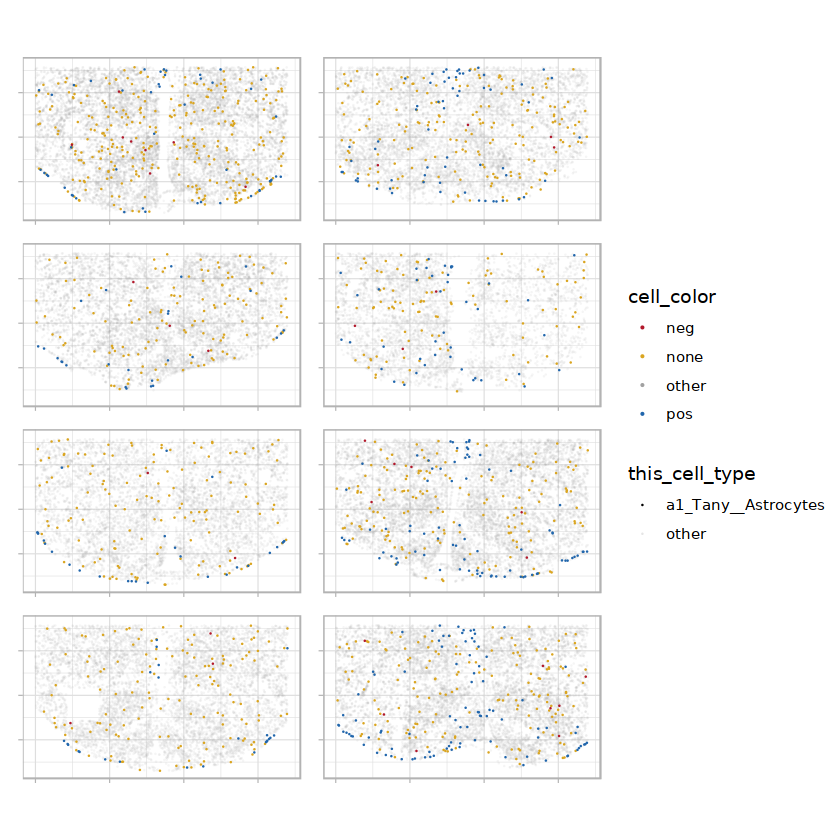

In [60]:
plot_all_samples_polarity(coord_comparison_df, 'a1_Tany__Astrocytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


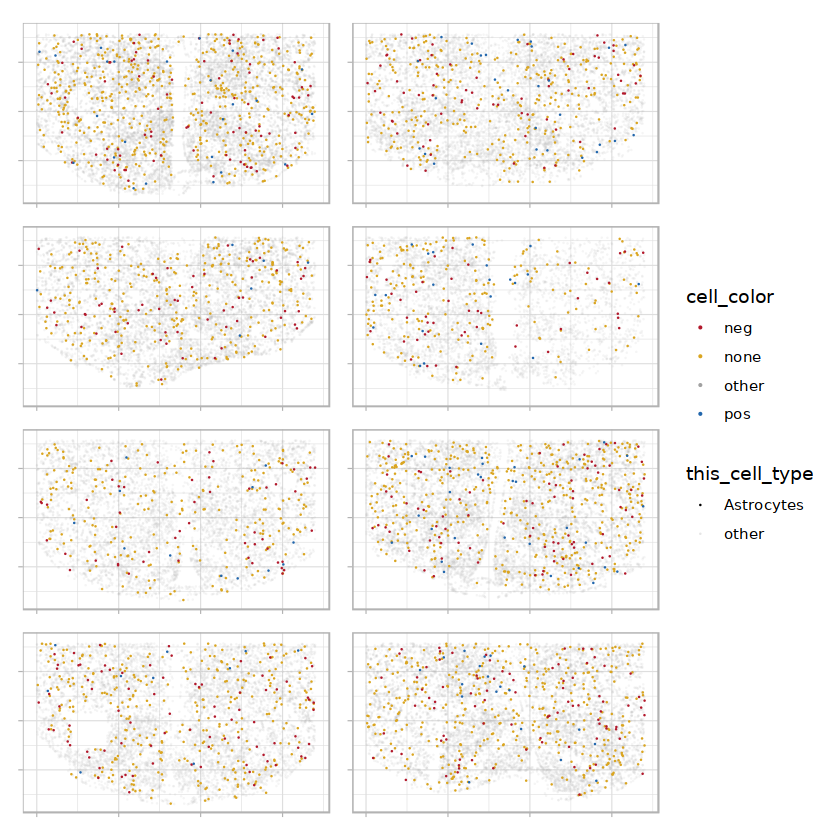

In [61]:
plot_all_samples_polarity(coord_comparison_df, 'Astrocytes')

In [62]:
polarity_sig_df_wide = polarity_sig_df %>%
  pivot_wider(names_from = polarity, 
              values_from = c(pval, coef, z, significant, significant_adj, pval_corrected),
              names_sep = ".")

polarity_sig_df_wide

label,pval.neg,pval.pos,coef.neg,coef.pos,z.neg,z.pos,significant.neg,significant.pos,significant_adj.neg,significant_adj.pos,pval_corrected.neg,pval_corrected.pos
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>
Agrp,8.063255e-09,1.110223e-15,-0.6258552,-3.5860988,-5.7671306,-8.000000000,**,**,**,**,4.837953e-08,1.998401e-14
Astrocytes,5.587371e-02,4.304365e-02,0.2041678,0.3792553,1.9120194,2.023286227,,**,,,1.257158e-01,1.106837e-01
Htr3b,2.288789e-01,2.230850e-01,-0.2168860,0.5520572,-1.2032518,1.218365886,,,,,3.169092e-01,3.169092e-01
MOL,4.973740e-01,1.171858e-02,0.3126729,0.2356658,0.6786274,2.520507245,,**,,**,5.595458e-01,4.218690e-02
NG2_OPC2,7.510638e-02,4.716732e-01,-0.2788668,0.1261997,-1.7798142,0.719759248,,,,,1.502128e-01,5.595458e-01
Sst_Unc13c__Agrp,2.042892e-01,9.988378e-01,-0.6773464,0.2357295,-1.2694259,0.001456638,,,,,3.169092e-01,9.988378e-01
Trh_Lef1,2.549108e-03,1.907708e-02,-0.8185658,-0.4854029,-3.0174504,-2.344021385,**,**,**,,1.147098e-02,5.723123e-02
a1_Tany__Astrocytes,5.796093e-01,2.418306e-10,0.1904075,0.8782627,0.5539555,6.332110283,,**,,**,6.137040e-01,2.176475e-09
b1_Tanycytes,4.691275e-01,9.396394e-02,0.1912150,0.6703678,0.7238994,1.674848622,,,,,5.595458e-01,1.691351e-01


In [63]:
sig_df = ncells_sig_df %>%
left_join(polarity_sig_df_wide, by='label') %>%
# mutate(z.neg = ifelse(is.na(z.neg), 0, z.neg),
#        z.pos = ifelse(is.na(z.pos), 0, z.pos),
#        pval_corrected.neg = ifelse(is.na(pval_corrected.neg), 1, pval_corrected.neg),
#        pval_corrected.pos = ifelse(is.na(pval_corrected.pos), 1, pval_corrected.pos)) %>%
# mutate(sort_col = pval_corrected * pval_corrected.neg * pval_corrected.pos) %>%
# mutate(sort_col = sign(zscore) * abs(zscore * z.pos * z.neg)) %>%
mutate(sort_col = zscore) %>%
arrange(desc(sort_col)) %>%
mutate(label = factor(label, levels=label))


sig_df %>% head

label,pval,coef,zscore,pval_corrected,significant,significant_adj,pval.neg,pval.pos,coef.neg,coef.pos,z.neg,z.pos,significant.neg,significant.pos,significant_adj.neg,significant_adj.pos,pval_corrected.neg,pval_corrected.pos,sort_col
<fct>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<chr>,<chr>,<chr>,<chr>,<dbl>,<dbl>,<dbl>
NFOL,0.0008566117,0.8633508,3.333823,0.0222719,**,**,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,3.333823
Pomc_Glipr1__Slc17a6_Trhr,0.0125829326,0.1457817,2.495360,0.1964007,**,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,2.495360
Microglia,0.0731174245,0.2061609,1.792097,0.4437853,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.792097
a1_Tany__Astrocytes,0.0973674650,0.1633468,1.657752,0.4437853,,,0.5796093,2.418306e-10,0.1904075,0.8782627,0.5539555,6.33211,,**,,**,0.613704,2.176475e-09,1.657752
Ghrh,0.1039067106,0.1438281,1.626202,0.4437853,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.626202
b2_Tany,0.1155027671,0.1612012,1.573934,0.4437853,,,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,NA,1.573934


In [64]:
sig_df = sig_df %>%
mutate(significant_adj.neg = case_when(label == 'Trh_Lef1' ~ '',
                                       TRUE ~ significant_adj.neg)) %>%
mutate(significant_adj.pos = case_when(label == 'Agrp' ~ '',
                                       TRUE ~ significant_adj.pos))


Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”


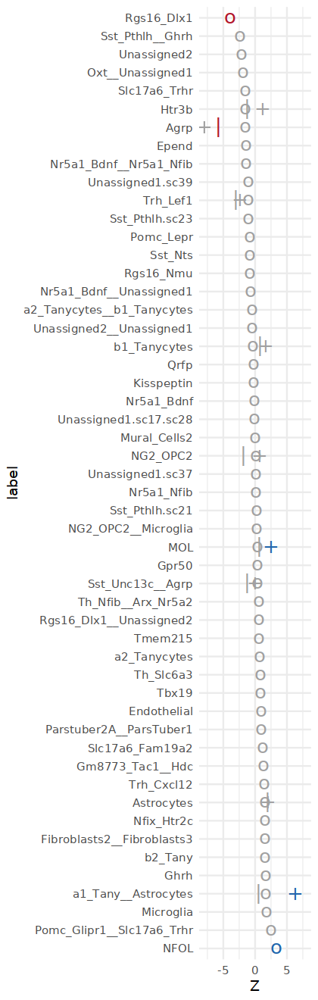

In [65]:
options(repr.plot.width=3.5, repr.plot.height=11)

# Convert 'label' column to a factor
sig_df$label <- as.factor(sig_df$label)

# Define conditions for colors
sig_df$zscore_col <- ifelse(sig_df$zscore > 0 & sig_df$significant_adj == '**', "#2166ac",
                            ifelse(sig_df$zscore < 0 & sig_df$significant_adj == '**', "#b2182b", "#a1a1a1"))
sig_df$zpos_col <- ifelse(sig_df$z.pos > 0 & sig_df$significant_adj.pos == '**', "#2166ac",
                         ifelse(sig_df$z.pos < 0 & sig_df$significant_adj.pos == '**', "#b2182b", "#a1a1a1"))
sig_df$zneg_col <- ifelse(sig_df$z.neg > 0 & sig_df$significant_adj.neg == '**', "#2166ac",
                         ifelse(sig_df$z.neg < 0 & sig_df$significant_adj.neg == '**', "#b2182b", "#a1a1a1"))

# Create the scatter plot
ggp_sig = ggplot(sig_df) +
  # Add a scatter plot for 'zscore'
  geom_point(aes(y = label, x = zscore, color = zscore_col), shape = 'o', size = 5) +
  # Add a scatter plot for 'z.pos'
  geom_point(aes(y = label, x = z.pos, color = zpos_col), shape = '+', size = 5) +
  # Add a scatter plot for 'z.neg'
  geom_point(aes(y = label, x = z.neg, color = zneg_col), shape = '|', size = 5) +
  # Specify the colors for each condition
  scale_color_identity() +
  # Set the x-axis limits
  scale_x_continuous(limits = c(-8, 8)) +
  # Add the plot title and labels
  labs(x = "Z") +
  # Set the plot theme
  theme_minimal()

ggp_sig

In [66]:
sig_df %>% filter(label == 'Agrp') %>% select(label, zscore,  zscore_col, z.neg, zneg_col, z.pos,  zpos_col)

label,zscore,zscore_col,z.neg,zneg_col,z.pos,zpos_col
<fct>,<dbl>,<chr>,<dbl>,<chr>,<dbl>,<chr>
Agrp,-1.488765,#a1a1a1,-5.767131,#b2182b,-8,#a1a1a1


In [67]:
plot_all_samples_polarity_2row = function(coord_comparison_df, cell_type, pt_size=0.2){
    p1 = plot_single_slice_label(coord_comparison_df, 'A1', cell_type, pt_size=pt_size) + theme(legend.position = "none") + labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label(coord_comparison_df, 'A2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p3 = plot_single_slice_label(coord_comparison_df, 'B1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p4 = plot_single_slice_label(coord_comparison_df, 'B2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p5 = plot_single_slice_label(coord_comparison_df, 'C1', cell_type, pt_size=pt_size) + theme(legend.position = "none") + labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label(coord_comparison_df, 'C2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p7 = plot_single_slice_label(coord_comparison_df, 'D1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p8 = plot_single_slice_label(coord_comparison_df, 'D2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    label_plot <- ggplot() +
      labs(y = cell_type) +
      theme_void()

    
    layout <- '
    ABCD
    EFGH
    '

    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0))

    ggp
}

In [68]:
p_Microglia = plot_all_samples_polarity_2row(coord_comparison_df, 'Microglia')
p_MOL = plot_all_samples_polarity_2row(coord_comparison_df, 'MOL')
p_Trh_Lef1 = plot_all_samples_polarity_2row(coord_comparison_df, 'Trh_Lef1')
p_Astrocytes = plot_all_samples_polarity_2row(coord_comparison_df, 'Astrocytes')
p_a1_Tany__Astrocytes = plot_all_samples_polarity_2row(coord_comparison_df, 'a1_Tany__Astrocytes')
p_a2_Tanycytes = plot_all_samples_polarity_2row(coord_comparison_df, 'a2_Tanycytes')
p_NFOL = plot_all_samples_polarity_2row(coord_comparison_df, 'NFOL')
p_Agrp = plot_all_samples_polarity_2row(coord_comparison_df, 'Agrp')
p_Rgs16_Dlx1 = plot_all_samples_polarity_2row(coord_comparison_df, 'Rgs16_Dlx1')

In [69]:
options(repr.plot.width=8.5, repr.plot.height=11)
layout <- '
ABBBBBB
ACCCCCC
ADDDDDD
AEEEEEE
AFFFFFF
AGGGGGG
AHHHHHH
'

ggp = wrap_plots(A = ggp_sig,
           B = p_Microglia,
           C = p_MOL,
           D = p_Trh_Lef1,
           E = p_Astrocytes,
           F = p_a1_Tany__Astrocytes,
           G = p_a2_Tanycytes,
           H = p_NFOL,
    design = layout) +
plot_layout(guides = 'auto') 

In [70]:
options(repr.plot.width=8.5, repr.plot.height=11)
layout <- '
ABBBBBB
ACCCCCC
ADDDDDD
AEEEEEE
AGGGGGG
'

ggp = wrap_plots(A = ggp_sig,
           B = p_Rgs16_Dlx1 ,
           C = p_Agrp,
           D = p_MOL,
           E = p_a1_Tany__Astrocytes,
           G = p_NFOL,
    design = layout) +
plot_layout(guides = 'auto') 

In [71]:
ggp %>% ggsave("spatial_sig_plots.pdf", ., width = 7, height = 9)

Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing

In [72]:
ggp %>% ggsave("spatial_sig_plots.png", ., width = 8.5, height = 11)

Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing

In [73]:
plot_single_slice_label_ct = function(coord_comparison_df, sample, cell_type, pt_size=0.1){
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(label == cell_type ~ !!cell_type,
                                          TRUE ~ 'other'),
               polarity_factor = factor(polarity, levels = c('none', 'neg', 'pos')),
               cell_type_factor = factor(label == cell_type, levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(polarity))) %>%
        arrange(cell_type_factor, polarity_factor) %>%
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(values = c('none' =  "#000000",
                                        'pos' = "#000000",
                                        'neg' = "#000000",
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = setNames(c("other" = 16, "this" = 16), c("other", cell_type))) +
          scale_alpha_manual(values = setNames(c("other" = 0.1, "this" = 1), c("other", cell_type))) +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank()    # Remove y-axis labels
        )
    
    ggp
}


Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”


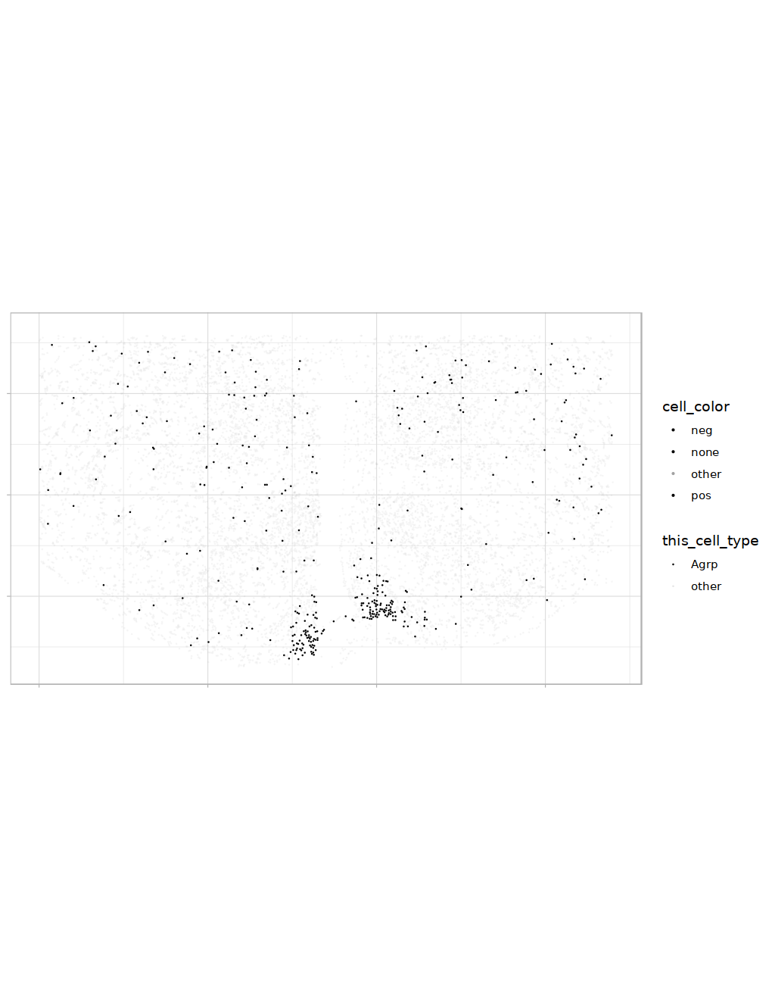

In [74]:
plot_single_slice_label_ct(coord_comparison_df, 'A1', 'Agrp')

In [75]:
plot_all_samples_ct_2col = function(coord_comparison_df, cell_type, pt_size=0.2){
    p1 = plot_single_slice_label_ct(coord_comparison_df, 'A1', cell_type, pt_size=pt_size) + theme(legend.position = "none") #+ labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label_ct(coord_comparison_df, 'A2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p3 = plot_single_slice_label_ct(coord_comparison_df, 'B1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p4 = plot_single_slice_label_ct(coord_comparison_df, 'B2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p5 = plot_single_slice_label_ct(coord_comparison_df, 'C1', cell_type, pt_size=pt_size) + theme(legend.position = "none") #+ labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label_ct(coord_comparison_df, 'C2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p7 = plot_single_slice_label_ct(coord_comparison_df, 'D1', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    p8 = plot_single_slice_label_ct(coord_comparison_df, 'D2', cell_type, pt_size=pt_size) + theme(legend.position = "none")
    label_plot <- ggplot() +
      labs(y = cell_type) +
      theme_void()

    
    layout <- '
AE
BF
CG
DH
'

    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0))

    ggp
}

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


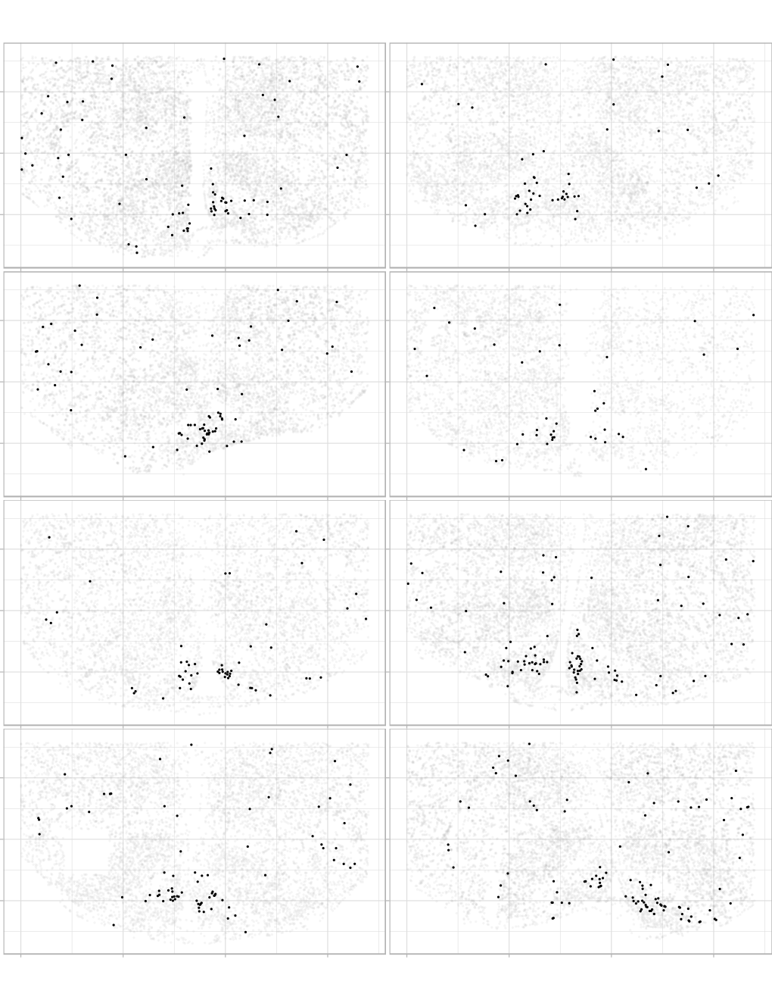

In [76]:
plot_all_samples_ct_2col(coord_comparison_df, 'Sst_Unc13c__Agrp', pt_size=0.3)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


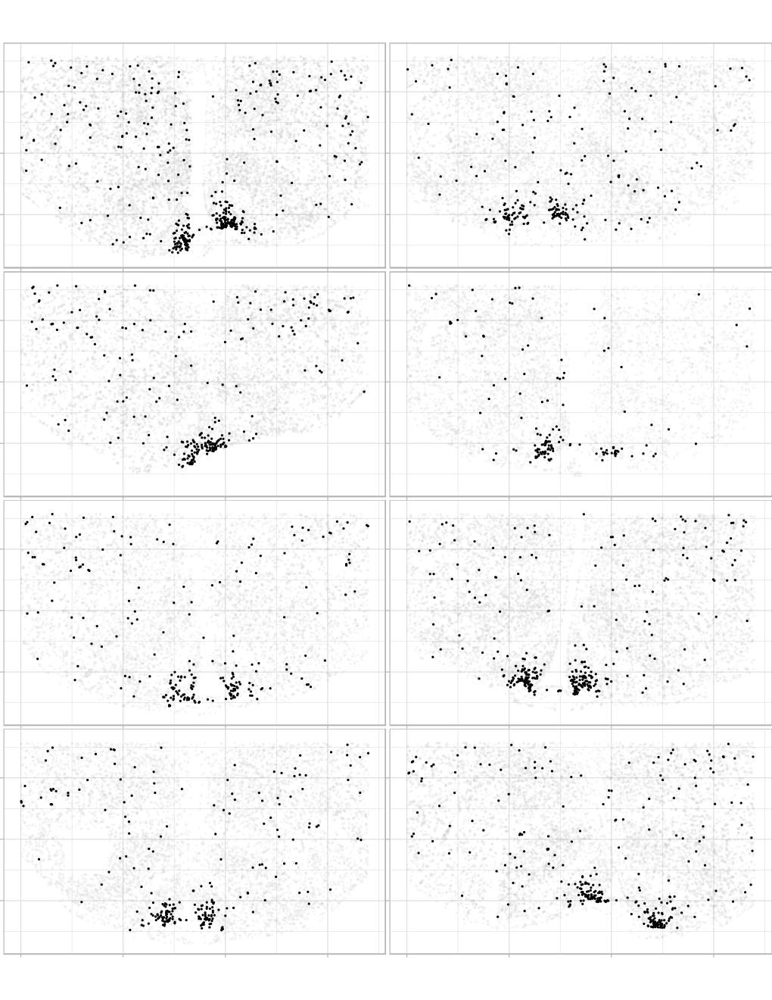

In [77]:
plot_all_samples_ct_2col(coord_comparison_df, 'Agrp', pt_size=0.3)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


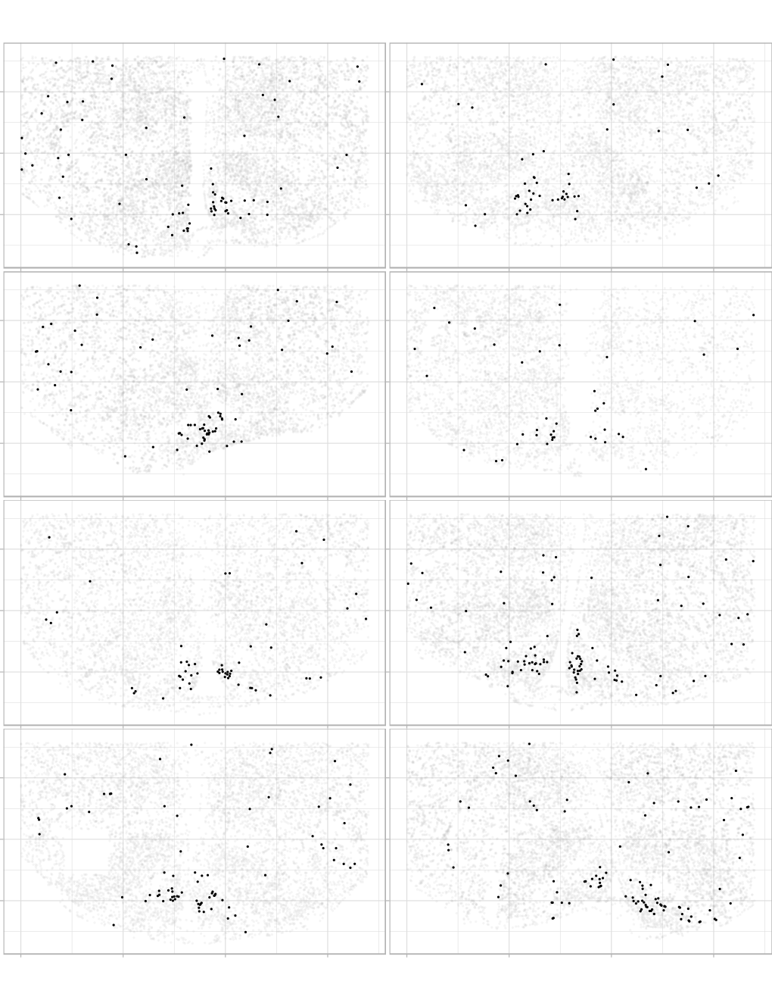

In [78]:
plot_all_samples_ct_2col(coord_comparison_df, 'Sst_Unc13c__Agrp', pt_size=0.3)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


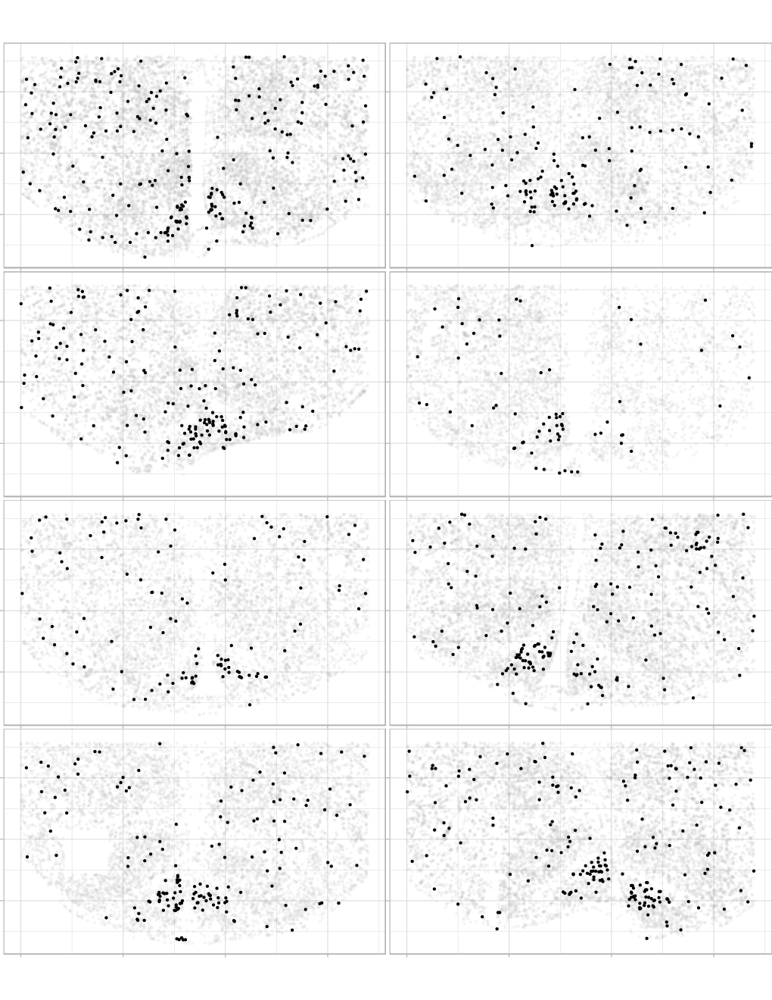

In [79]:
plot_all_samples_ct_2col(coord_comparison_df, 'Htr3b', pt_size=0.6)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


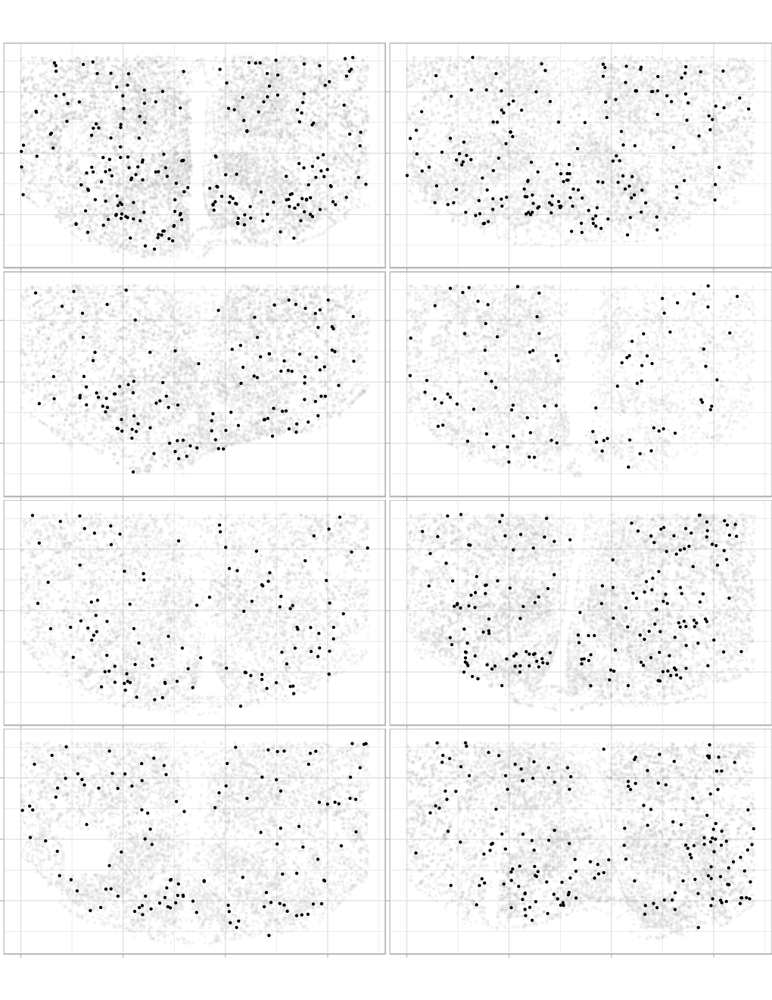

In [80]:
plot_all_samples_ct_2col(coord_comparison_df, 'Pomc_Glipr1__Slc17a6_Trhr', pt_size=0.6)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


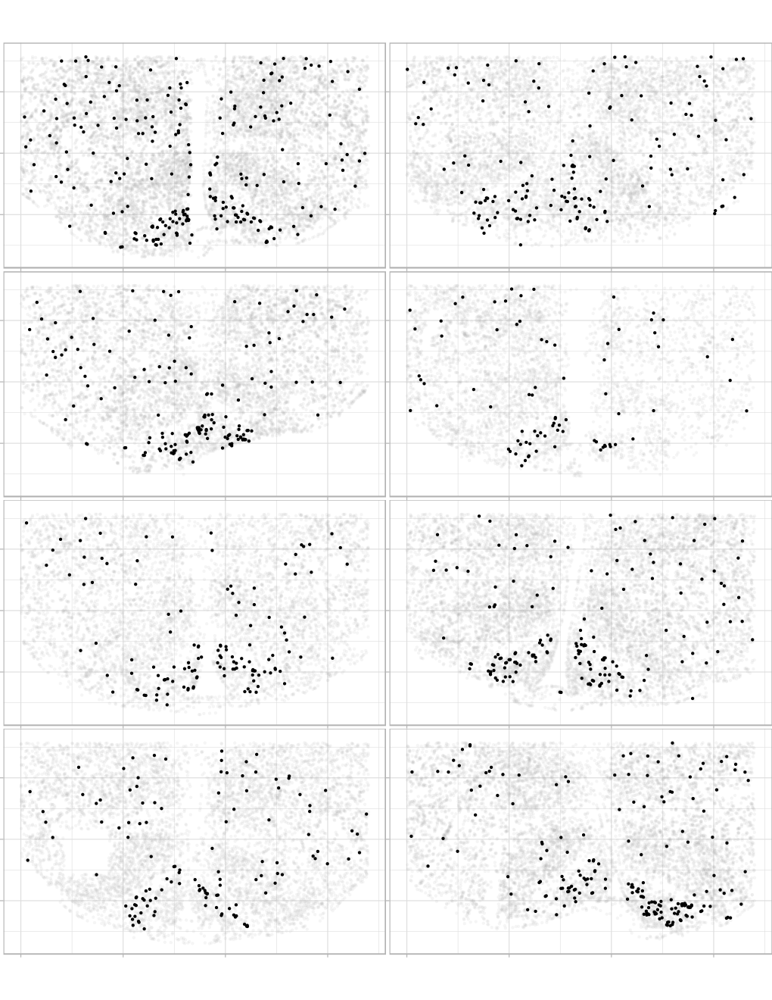

In [81]:
plot_all_samples_ct_2col(coord_comparison_df, 'Pomc_Lepr', pt_size=0.6)

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


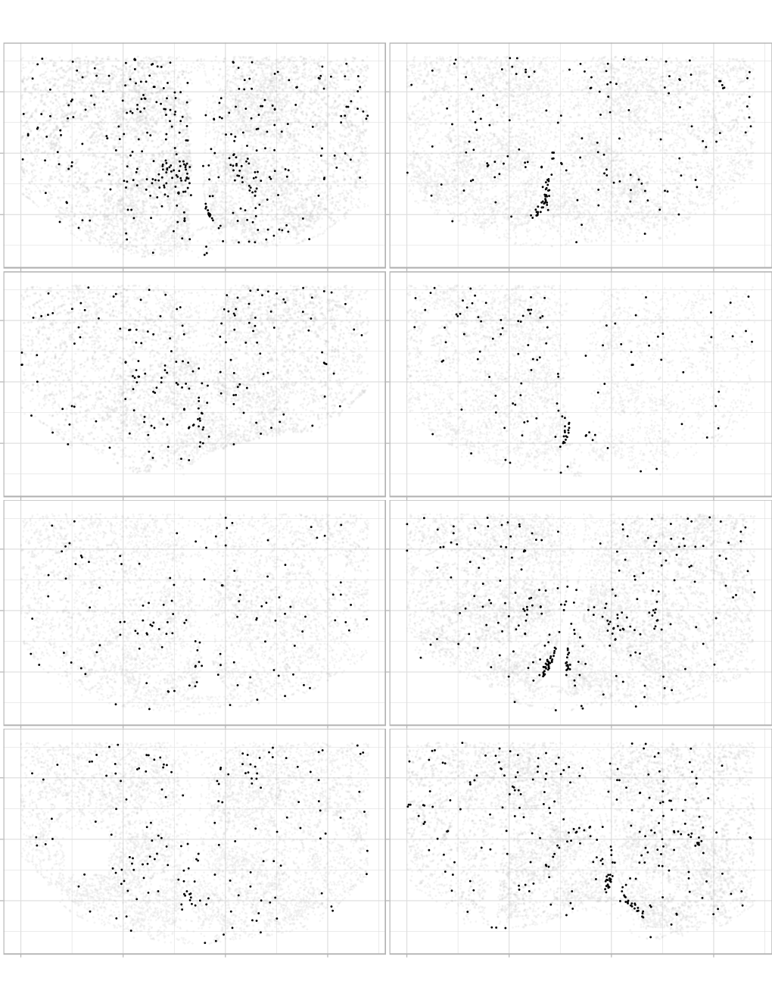

In [82]:
plot_all_samples_ct_2col(coord_comparison_df, 'a2_Tanycytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


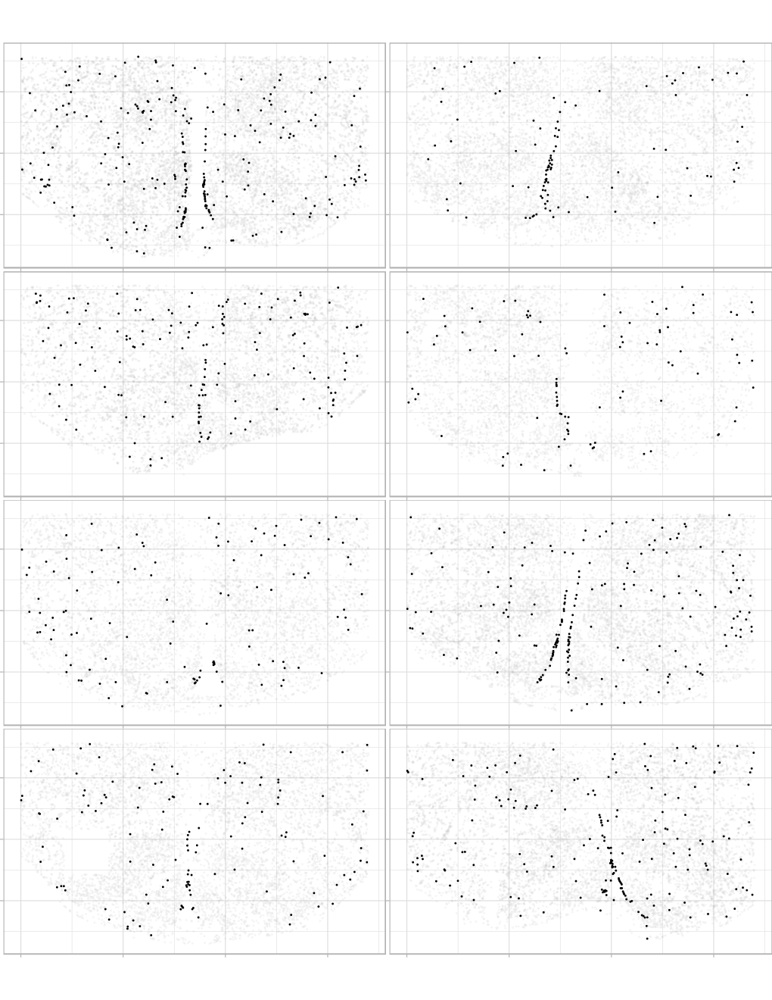

In [83]:
plot_all_samples_ct_2col(coord_comparison_df, 'b1_Tanycytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


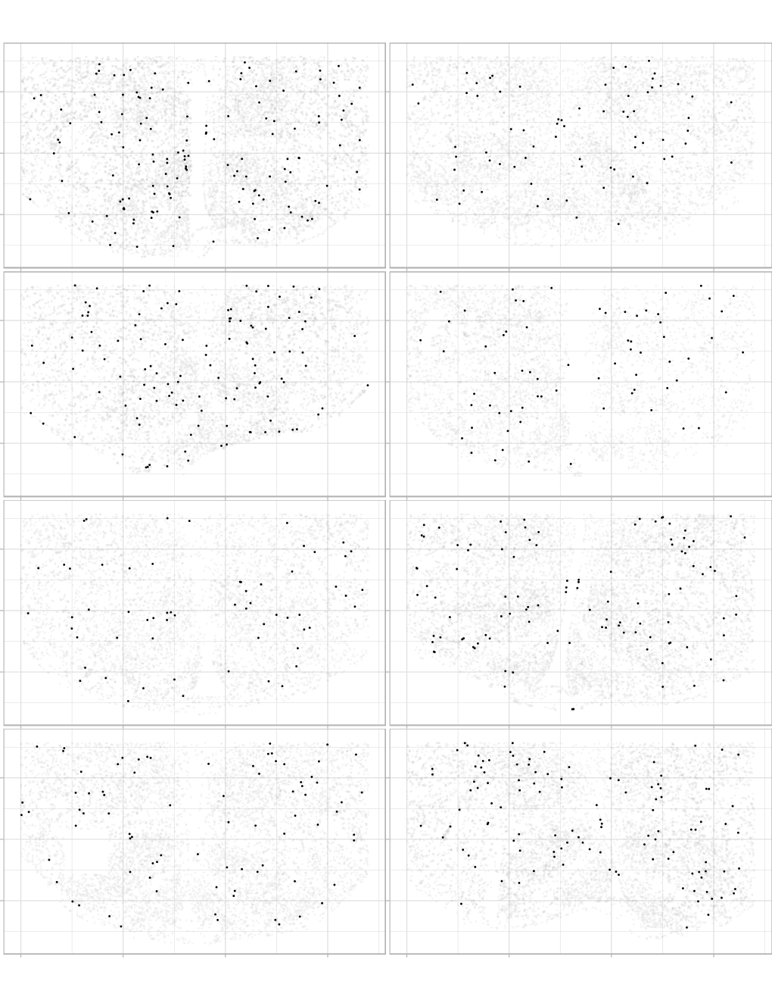

In [84]:
plot_all_samples_ct_2col(coord_comparison_df, 'a2_Tanycytes__b1_Tanycytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


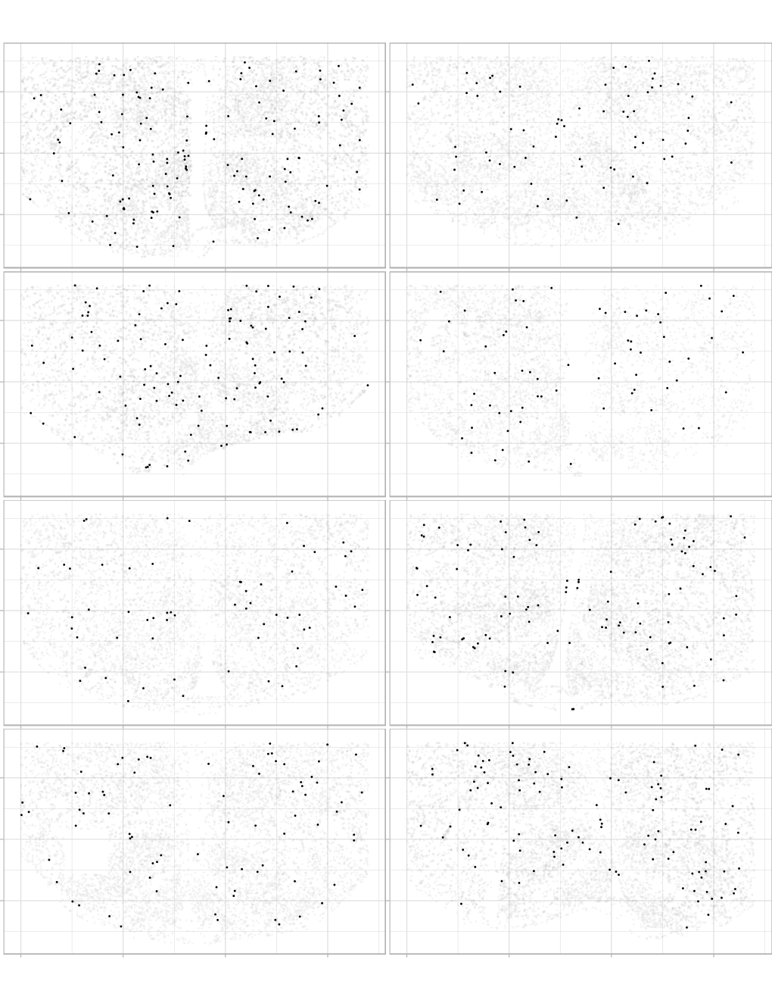

In [85]:

plot_all_samples_ct_2col(coord_comparison_df, 'a2_Tanycytes__b1_Tanycytes')

Warning message:
“Removed 59 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 13 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 64 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 43 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 18 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 49 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 60 rows containing missing values (`geom_point()`).”


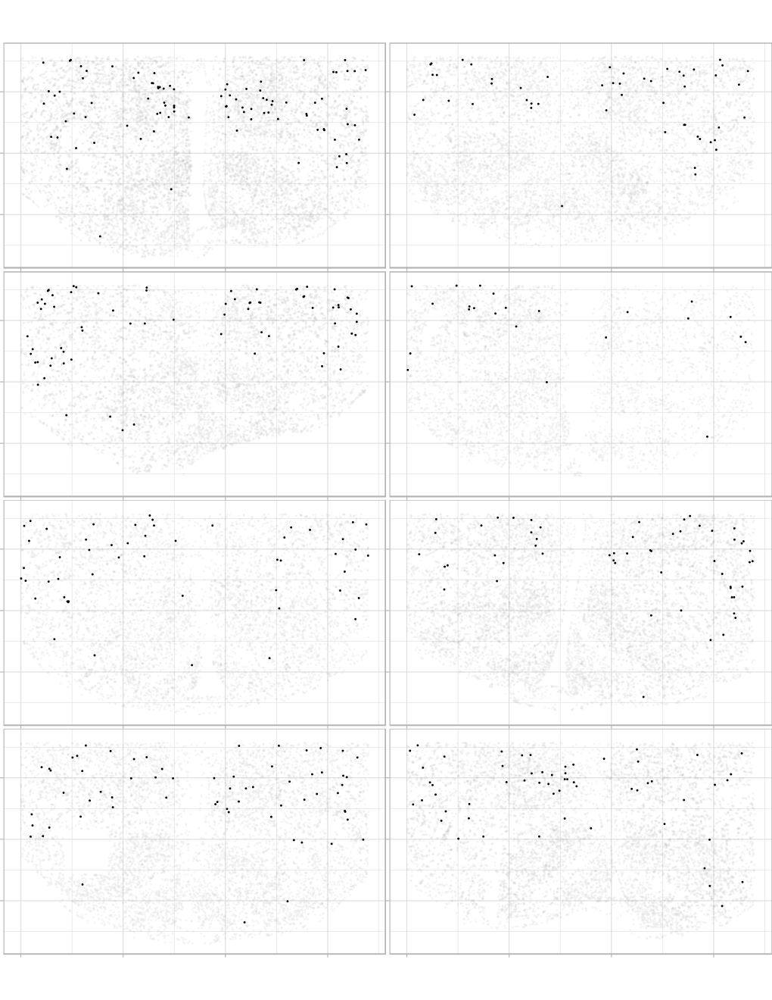

In [86]:

plot_all_samples_ct_2col(coord_comparison_df, 'Rgs16_Dlx1')

In [87]:
plot_single_slice_label_ct_tany = function(coord_comparison_df, sample, pt_size=0.1){
    tany_regex = "^(a2_Tanycytes|a2_Tanycytes__b1_Tanycytes|b1_Tanycytes|b2_Tany|a1_Tany__Astrocytes)$"
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(str_detect(label, tany_regex) ~ label,
                                          TRUE ~ 'other'),
               cell_type_factor = factor(str_detect(label, tany_regex), levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(this_cell_type))) %>%
        arrange(cell_type_factor) %>%
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(name = 'cell type',
                             values = c('a2_Tanycytes' =  "#af8dc3",
                                        'a2_Tanycytes__b1_Tanycytes' = "#e7d4e8",
                                        'b1_Tanycytes' = "#7fbf7b",
                                        'b2_Tany' = "#1b7837",
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = c("other" = 16,
                                        'a2_Tanycytes' = 16,
                                        'a2_Tanycytes__b1_Tanycytes' = 16,
                                        'b1_Tanycytes' = 16,
                                        'b2_Tany' = 16),
                             guide = 'none') +
          scale_alpha_manual(values = c("other" = 0.1,
                                        'a2_Tanycytes' = 1,
                                        'a2_Tanycytes__b1_Tanycytes' = 1,
                                        'b1_Tanycytes' = 1,
                                        'b2_Tany' = 1),
                             guide='none') +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank(),    # Remove y-axis labels
              legend.position = "right", 
              legend.key.size = unit(0.3, "cm"),
              legend.text = element_text(lineheight=0.5, size = 6)

        )
    
    ggp
}


Warning message:
“Removed 422 rows containing missing values (`geom_point()`).”


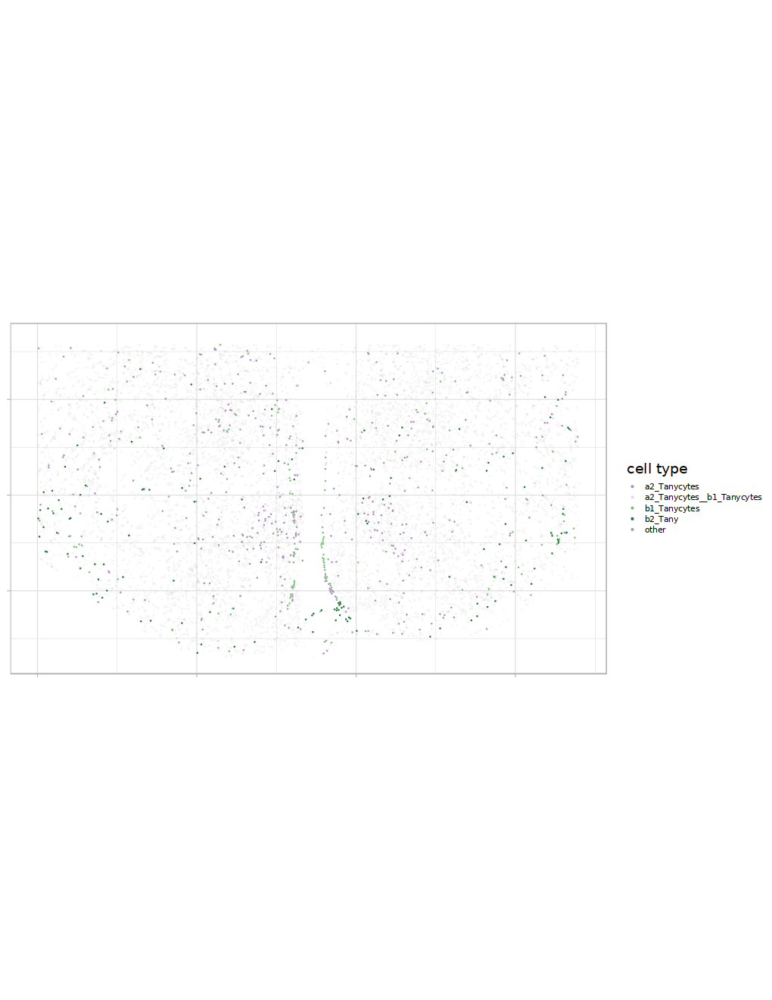

In [88]:
plot_single_slice_label_ct_tany(coord_comparison_df, 'A1')

In [89]:
plot_all_samples_ct_tany = function(coord_comparison_df, pt_size=0.1, plot_shape='2col'){
    p1 = plot_single_slice_label_ct_tany(coord_comparison_df, 'A1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label_ct_tany(coord_comparison_df, 'A2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p3 = plot_single_slice_label_ct_tany(coord_comparison_df, 'B1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p4 = plot_single_slice_label_ct_tany(coord_comparison_df, 'B2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p5 = plot_single_slice_label_ct_tany(coord_comparison_df, 'C1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label_ct_tany(coord_comparison_df, 'C2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p7 = plot_single_slice_label_ct_tany(coord_comparison_df, 'D1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p8 = plot_single_slice_label_ct_tany(coord_comparison_df, 'D2', pt_size=pt_size) #+ theme(legend.position = "bottom")

if (plot_shape == '2col'){
        layout <- '
AE
BF
CG
DH
'
}
if (plot_shape == '2row'){
            layout <- '
ABCD
EFGH
'
p1 = p1 + labs(y = paste0('Tanycytes', '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
p5 = p5 + labs(y = paste0('Tanycytes', '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
}


    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0),
#            legend.position = "bottom")
                       legend.position = "right")

    ggp
}

Warning message:
“Removed 422 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 165 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 184 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 237 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 291 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 166 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 298 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 326 rows containing missing values (`geom_point()`).”


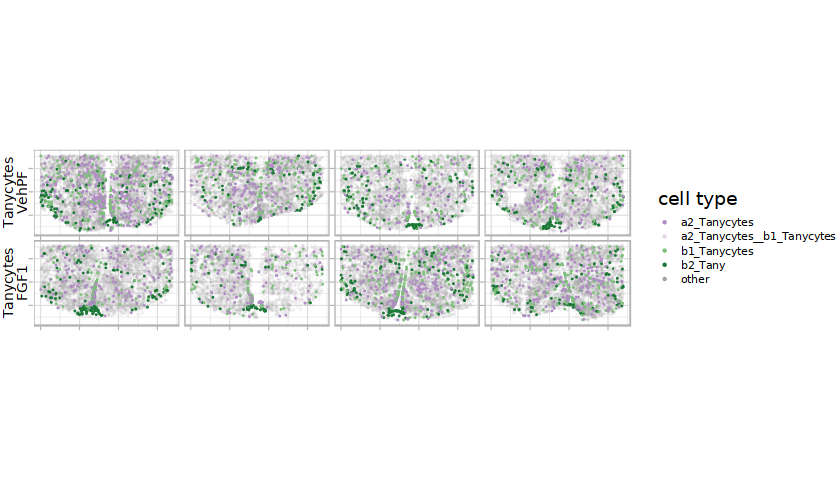

In [90]:
options(repr.plot.width=7, repr.plot.height=4)
tany_plot = plot_all_samples_ct_tany(coord_comparison_df, pt_size=0.2, plot_shape='2row')
tany_plot

In [91]:
plot_single_slice_label_ct_neurons = function(coord_comparison_df, sample, pt_size=0.1){
    tany_regex = "^(Agrp|Sst_Unc13c__Agrp|Pomc_Lepr|Pomc_Glipr1__Slc17a6_Trhr|Htr3b|Nr5a1_Bdnf)$"
    ggp = coord_comparison_df %>%
        filter(sample_name == sample) %>%
        mutate(this_cell_type = case_when(str_detect(label, tany_regex) ~ label,
                                          TRUE ~ 'other'),
               cell_type_factor = factor(str_detect(label, tany_regex), levels = c(FALSE, TRUE)),
               cell_color = ifelse(this_cell_type == 'other', 'other', as.character(this_cell_type))) %>%
        mutate(cell_color = factor(cell_color, levels=c("other", "Pomc_Glipr1__Slc17a6_Trhr", "Sst_Unc13c__Agrp",  "Htr3b", "Pomc_Lepr", "Agrp", "Nr5a1_Bdnf"))) %>%
        arrange(cell_color) %>%
        ggplot(aes(x = centroid_y, y = centroid_x, color = cell_color, alpha = this_cell_type, shape = this_cell_type)) + 
          geom_point(size=pt_size) +
          xlim(0, 17000) +
          ylim(900, 10900) +
          scale_color_manual(name = 'cell type',
                             values = c('Sst_Unc13c__Agrp' =  "#a6cee3",
                                        'Agrp' = "#1f78b4",
#                                         'Pomc_Glipr1__Slc17a6_Trhr' = "#33a02c", #"#b2df8a",
                                        'Pomc_Lepr' = "#33a02c",
                                        'Htr3b' = '#e31a1c',
                                        'Nr5a1_Bdnf' = '#fdbf6f',
                                        'other' = "#a1a1a1")) +  # green for "other"
          scale_shape_manual(values = c('Agrp' =  16,
                                        'Sst_Unc13c__Agrp' = 16,
                                        'Pomc_Lepr' = 16,
#                                         'Pomc_Glipr1__Slc17a6_Trhr' = 16,
                                        'Htr3b' = 16,
                                        'Nr5a1_Bdnf' = 16,
                                        'other' = 16), guide = 'none') +
          scale_alpha_manual(values = c('Agrp' =  1,
                                        'Sst_Unc13c__Agrp' = 1,
                                        'Pomc_Lepr' = 1,
#                                         'Pomc_Glipr1__Slc17a6_Trhr' = 1,
                                        'Htr3b' = 1,
                                        'Nr5a1_Bdnf' = 1,
                                        'other' = 0.1), guide = 'none') +
          coord_fixed() + 
          theme_light() +
          theme(axis.title.x = element_blank(),
                axis.title.y = element_blank()) + 
        theme(axis.text.x = element_blank(),   # Remove x-axis labels
              axis.text.y = element_blank(),    # Remove y-axis labels
              legend.position = "right", 
              legend.key.size = unit(0.3, "cm"),
              legend.text = element_text(lineheight=0.5, size = 6)
        )
    
    ggp
}


In [92]:
names(c('Sst_Unc13c__Agrp' =  "#a6cee3",
                                        'Agrp' = "#1f78b4",
                                        'Pomc_Glipr1__Slc17a6_Trhr' = "#33a02c", #"#b2df8a",
#                                         'Pomc_Lepr' = "#33a02c",
                                        'Htr3b' = '#e31a1c',
                                        'Nr5a1_Bdnf' = '#fdbf6f',
                                        'other' = "#a1a1a1")) %>% rev %>%dput

c("other", "Nr5a1_Bdnf", "Htr3b", "Pomc_Glipr1__Slc17a6_Trhr", 
"Agrp", "Sst_Unc13c__Agrp")


In [93]:
plot_all_samples_ct_neurons = function(coord_comparison_df, pt_size=0.2, plot_shape='2col'){
    p1 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'A1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p2 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'A2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p3 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'B1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p4 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'B2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p5 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'C1', pt_size=pt_size) #+ theme(legend.position = "bottom") #+ labs(y = paste0(cell_type, '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
    p6 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'C2', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p7 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'D1', pt_size=pt_size) #+ theme(legend.position = "bottom")
    p8 = plot_single_slice_label_ct_neurons(coord_comparison_df, 'D2', pt_size=pt_size) #+ theme(legend.position = "bottom")

if (plot_shape == '2col'){
        layout <- '
AE
BF
CG
DH
'
}
if (plot_shape == '2row'){
            layout <- '
ABCD
EFGH
'
p1 = p1 + labs(y = paste0('Neurons', '\nVehPF')) + theme(axis.title.y = element_text(size = 8, angle = 90))
p5 = p5 + labs(y = paste0('Neurons', '\nFGF1')) + theme(axis.title.y = element_text(size = 8, angle = 90))
}


    ggp = wrap_plots(A = p1,
               B = p2,
               C = p3,
               D = p4,
               E = p5,
               F = p6,
               G = p7,
               H = p8,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0),
#            legend.position = "bottom")
            )
    ggp
}

Warning message:
“Removed 278 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 134 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 127 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 186 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 217 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 108 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 234 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 235 rows containing missing values (`geom_point()`).”


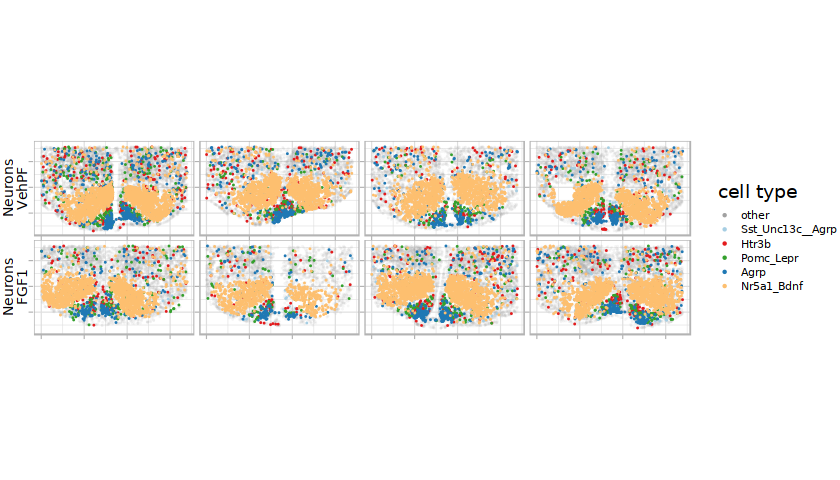

In [94]:
options(repr.plot.width=7, repr.plot.height=4)
neurons_plot = plot_all_samples_ct_neurons(coord_comparison_df, pt_size=0.2, plot_shape='2row')
neurons_plot

In [95]:
obj_fgf1 = qs::qread('obj_fgf1_obob5v5.qs')
obj_fgf1

An object of class Seurat 
57395 features across 27188 samples within 3 assays 
Active assay: SCT (25074 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

In [96]:
xe_obj = qs::qread(xe_obj_path)

xe_obj@meta.data = xe_obj@meta.data %>%
mutate(predicted.polar_label = polar_label)

xe_obj@meta.data = xe_obj %>% `[[` %>%
mutate(base_label = predicted.polar_label %>% str_replace(fixed('.neg'), '') %>% str_replace(fixed('.none'), '') %>% str_replace(fixed('.pos'), ''))

xe_obj@meta.data = xe_obj@meta.data %>% mutate(base_label = str_replace(base_label, fixed('__'), '\n'))

In [97]:
xe_obj %>% `[[` %>% distinct(base_label) %>% pull(base_label)

[1] "Tmem215"                    "Slc17a6_Trhr"              
 [3] "Pomc_Lepr"                  "Unassigned2"               
 [5] "Tbx19"                      "Ghrh"                      
 [7] "Trh_Cxcl12"                 "Nr5a1_Bdnf"                
 [9] "Kisspeptin"                 "Gm8773_Tac1\nHdc"          
[11] "Rgs16_Dlx1\nUnassigned2"    "Unassigned1.sc17.sc28"     
[13] "Rgs16_Nmu"                  "Slc17a6_Fam19a2"           
[15] "Unassigned1.sc39"           "Unassigned1.sc37"          
[17] "Nr5a1_Nfib"                 "Htr3b"                     
[19] "Sst_Pthlh.sc21"             "Sst_Pthlh\nGhrh"           
[21] "Agrp"                       "Th_Nfib\nArx_Nr5a2"        
[23] "Trh_Lef1"                   "Nr5a1_Bdnf\nUnassigned1"   
[25] "Oxt\nUnassigned1"           "Pomc_Glipr1\nSlc17a6_Trhr" 
[27] "Qrfp"                       "Nr5a1_Bdnf\nNr5a1_Nfib"    
[29] "Sst_Pthlh.sc23"             "Sst_Unc13c\nAgrp"          
[31] "Sst_Nts"                    "Rgs16_Dlx1"                
[33] "Gpr50"                      "Nfix_Htr2c"                
[35] "Unassigned2\nUnassigned1"   "Th_Slc6a3"                 
[37] "a1_Tany\nAstrocytes"        "Astrocytes"                
[39] "NG2_OPC2"                   "a2_Tanycytes"              
[41] "MOL"                        "a2_Tanycytes\nb1_Tanycytes"
[43] "b1_Tanycytes"               "NFOL"                      
[45] "Endothelial"                "b2_Tany"                   
[47] "NG2_OPC2\nMicroglia"        "Fibroblasts2\nFibroblasts3"
[49] "Epend"                      "Microglia"                 
[51] "Parstuber2A\nParsTuber1"    "Mural_Cells2"

In [98]:
obj_fgf1 %>% `[[` %>% colnames

[1] "orig.ident"                    "nCount_RNA"                   
 [3] "nFeature_RNA"                  "Index.10x"                    
 [5] "nCount_HTO"                    "nFeature_HTO"                 
 [7] "Index.HTO"                     "nCount_spliced"               
 [9] "nFeature_spliced"              "nCount_unspliced"             
[11] "nFeature_unspliced"            "HTO_mcl_maxID"                
[13] "HTO_mcl_secondID"              "HTO_mcl_margin"               
[15] "HTO_mcl_classification"        "HTO_mcl_classification.global"
[17] "hash.mcl.ID"                   "doublet"                      
[19] "predicted_dub_std"             "predicted_dub_cut"            
[21] "predicted_dub_all"             "nCount_SCT"                   
[23] "nFeature_SCT"                  "SCT_snn_res.0.8"              
[25] "seurat_clusters"               "strain"                       
[27] "treatment"                     "time"                         
[29] "collection_date"               "isolation_date"               
[31] "batch"                         "predicted.id"                 
[33] "prediction.score.max"          "labels"                       
[35] "cell_class"                    "polar_label"                  
[37] "nCount_integrated"             "nFeature_integrated"

Warning message:
“Removed 278 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 134 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 127 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 186 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 217 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 108 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 234 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 235 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 422 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 165 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 184 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 237 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 291 rows conta

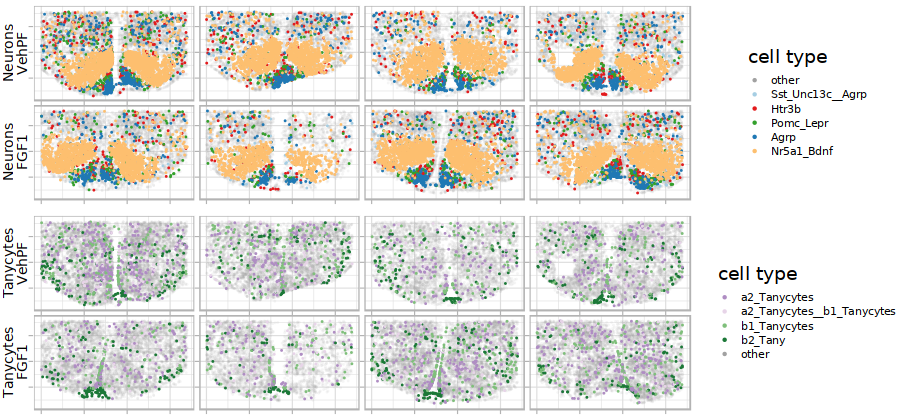

In [99]:
options(repr.plot.width=7.5, repr.plot.height=3.5)
layout <- '
B
B
C
C
'
ggp = wrap_plots(B = neurons_plot,
                 C = tany_plot,
        design = layout) +
    plot_layout(guides = 'collect') & 
      theme(plot.margin = margin(0, 0, 0, 0))

    ggp

In [100]:
ggp %>% ggsave("label_transfer_spatial_only.pdf", ., width = 7.5, height = 3.5)

Warning message:
“Removed 278 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 134 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 127 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 186 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 217 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 108 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 234 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 235 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 422 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 165 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 184 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 237 rows containing missing values (`geom_point()`).”
Warning message:
“Removed 291 rows conta

In [101]:
markers = qs::qread('_targets/objects/polar_label_markers_2s')
markers

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Gpc6...1,2.943105e-20,-0.9195502,0.087,0.846,2.854812e-18,Unassigned1.sc17.sc28.none,Gpc6
Kirrel3...2,3.171792e-14,-1.4596740,0.221,1.000,3.076638e-12,Unassigned1.sc17.sc28.none,Kirrel3
Robo1...3,1.078699e-12,-0.8320377,0.190,1.000,1.046338e-10,Unassigned1.sc17.sc28.none,Robo1
Mgat4c...4,2.595589e-11,-0.8838070,0.179,0.923,2.517721e-09,Unassigned1.sc17.sc28.none,Mgat4c
Ptprt...5,4.481566e-10,-1.4147746,0.347,1.000,4.347119e-08,Unassigned1.sc17.sc28.none,Ptprt
Pcdh7...6,2.552393e-09,-1.6410143,0.524,1.000,2.475821e-07,Unassigned1.sc17.sc28.none,Pcdh7
Gria1...7,1.081004e-08,2.0098113,0.913,0.000,1.048574e-06,Unassigned1.sc17.sc28.none,Gria1
Tenm3...8,1.091070e-04,-0.5894179,0.408,0.923,1.058338e-02,Unassigned1.sc17.sc28.none,Tenm3
Cadm2...9,1.418856e-04,-0.7012819,0.433,0.923,1.376290e-02,Unassigned1.sc17.sc28.none,Cadm2


In [102]:
markers %>% filter(cluster == 'Agrp.pos')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Cntn5.1,1.403545e-16,1.2271296,0.923,0.394,1.389510e-14,Agrp.pos,Cntn5
Galntl6,2.389697e-14,0.6688746,0.462,0.097,2.365800e-12,Agrp.pos,Galntl6
Car10,1.886382e-08,0.5614749,0.564,0.201,1.867518e-06,Agrp.pos,Car10
Sgcz,2.387390e-07,0.5762709,0.410,0.132,2.363516e-05,Agrp.pos,Sgcz
Kctd16,3.510039e-06,0.6384483,0.949,0.802,3.474938e-04,Agrp.pos,Kctd16
Plcl1,5.877021e-06,0.4471066,0.564,0.239,5.818250e-04,Agrp.pos,Plcl1
Tenm3.1,7.676461e-06,0.6523692,0.846,0.529,7.599696e-04,Agrp.pos,Tenm3
Ptprd.1,1.284201e-04,-0.7652747,0.564,0.734,1.271359e-02,Agrp.pos,Ptprd
Deptor,1.589083e-04,-0.7136137,0.308,0.575,1.573192e-02,Agrp.pos,Deptor


In [103]:
markers %>% filter(cluster == 'Agrp.neg')

,p_val,avg_log2FC,pct.1,pct.2,p_val_adj,cluster,gene
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<fct>,<chr>
Rmst.1,1.786458e-19,0.7643216,0.892,0.760,1.768593e-17,Agrp.neg,Rmst
Rax.1,5.639284e-18,0.3379714,0.181,0.035,5.582892e-16,Agrp.neg,Rax
Agrp.1,5.563085e-15,0.8378282,0.922,0.818,5.507454e-13,Agrp.neg,Agrp
Rbfox1.1,1.861607e-11,-0.7507459,0.386,0.606,1.842991e-09,Agrp.neg,Rbfox1
Col25a1.1,6.014069e-10,0.8360506,0.590,0.408,5.953928e-08,Agrp.neg,Col25a1
Tenm2.1,5.512420e-08,-0.5063820,0.265,0.480,5.457296e-06,Agrp.neg,Tenm2
Trpm3.1,5.591785e-08,0.4958969,0.590,0.412,5.535867e-06,Agrp.neg,Trpm3
Grm7.1,2.325094e-07,-0.6165644,0.265,0.443,2.301843e-05,Agrp.neg,Grm7
Cadm2.1,2.400633e-07,-0.5813748,0.187,0.376,2.376627e-05,Agrp.neg,Cadm2


In [104]:
obj_fgf1_neurons = qs::qread('_targets/objects/obj_fgf1')
obj_fgf1_neurons

An object of class Seurat 
57395 features across 27188 samples within 3 assays 
Active assay: SCT (25074 features, 3000 variable features)
 2 other assays present: RNA, integrated
 2 dimensional reductions calculated: pca, umap

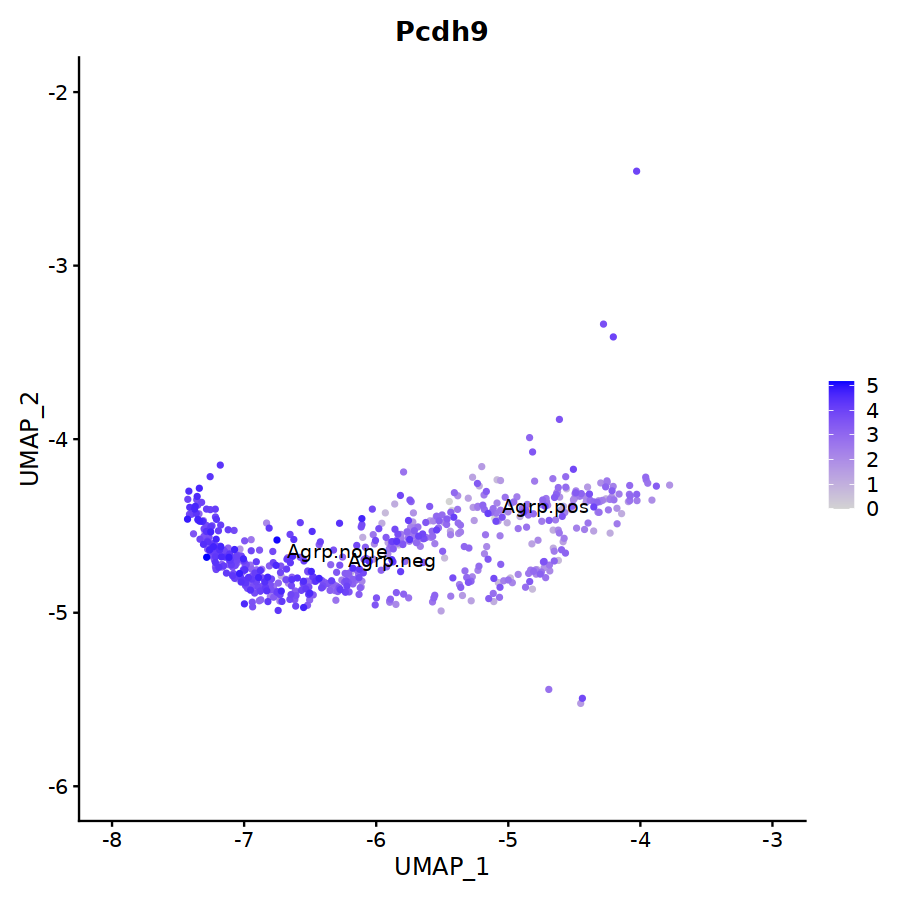

In [105]:
options(repr.plot.width=7.5, repr.plot.height=7.5)
Idents(obj_fgf1_neurons) = obj_fgf1_neurons@meta.data$polar_label
agrp_cells = obj_fgf1_neurons %>% `[[` %>% filter(labels == 'Agrp') %>% rownames
FeaturePlot(object = obj_fgf1_neurons, features = 'Pcdh9', cells = agrp_cells, label = TRUE, order=TRUE)

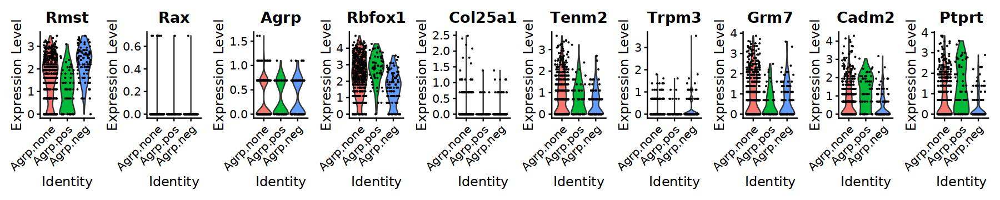

In [106]:
options(repr.plot.width=15, repr.plot.height=3)
obj_fgf1_neurons %>%
subset(cells = agrp_cells) %>%
VlnPlot(features= markers %>% filter(cluster == 'Agrp.neg') %>% head(10) %>% pull(gene), ncol=10)

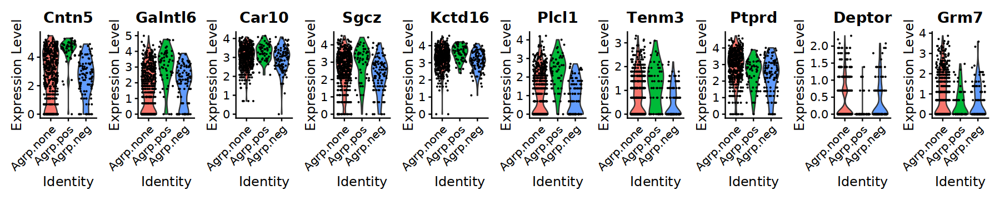

In [107]:
options(repr.plot.width=15, repr.plot.height=3)
obj_fgf1_neurons %>%
subset(cells = agrp_cells) %>%
VlnPlot(features= markers %>% filter(cluster == 'Agrp.pos') %>% head(10) %>% pull(gene), ncol=10)

In [108]:
obj_fgf1_neurons %>% `[[` %>% head

,orig.ident,nCount_RNA,nFeature_RNA,Index.10x,nCount_HTO,nFeature_HTO,Index.HTO,nCount_spliced,nFeature_spliced,nCount_unspliced,⋯,collection_date,isolation_date,batch,predicted.id,prediction.score.max,labels,cell_class,polar_label,nCount_integrated,nFeature_integrated
,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<chr>,<dbl>,<int>,<dbl>,⋯,<chr>,<chr>,<chr>,<chr>,<dbl>,<chr>,<chr>,<chr>,<dbl>,<int>
TTCTAGTGTTAACCTG_3_3_1,SI-TT-C12,36340,5631,SI-TT-C12,1151,12,D706,4463,2244,31877,⋯,211213,24/6/2022,Batch 3,Nr5a1_Bdnf,1.0000000,Nr5a1_Bdnf,neuron,Nr5a1_Bdnf.none,0,0
AAGCCATCACTGGACC_1_3_1,SI-TT-A12,24323,5032,SI-TT-A12,911,12,D704,3657,1985,20666,⋯,220329,24/6/2022,Batch 3,Gpr50,0.4365543,Gpr50,neuron,Gpr50.none,0,0
TAGGTACAGACCGTTT_1_3_1,SI-TT-A12,36414,5761,SI-TT-A12,1054,12,D704,4686,2364,31728,⋯,220329,24/6/2022,Batch 3,Nr5a1_Bdnf,0.9720783,Nr5a1_Bdnf,neuron,Nr5a1_Bdnf.none,0,0
TTCGATTGTGGCTAGA_2_3_1,SI-TT-B12,16870,4301,SI-TT-B12,813,12,D705,2917,1616,13953,⋯,220328,24/6/2022,Batch 3,Unassigned1,0.5512957,Unassigned1.sc39,neuron,Unassigned1.sc39.none,0,0
ATTCATCCATACAGAA_1_2_1,SI-TT-C11,29289,5126,SI-TT-C11,907,12,D707,3493,1903,25796,⋯,211213,23/6/2022,Batch 2,Unassigned1,0.7526640,Unassigned1.sc17.sc28,neuron,Unassigned1.sc17.sc28.none,0,0
CTAACTTCAAAGGCTG_2_3_1,SI-TT-B12,37702,5828,SI-TT-B12,874,12,D705,4755,2399,32947,⋯,220329,24/6/2022,Batch 3,Pomc_Glipr1,0.8351124,Pomc_Glipr1-Slc17a6_Trhr,neuron,Pomc_Glipr1__Slc17a6_Trhr.none,0,0


In [109]:
coord_comparison_df %>%
filter(label == 'Agrp') %>%
group_by(sample_name, treatment, polarity) %>%
summarise(n = n())

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.


sample_name,treatment,polarity,n
<chr>,<fct>,<fct>,<int>
A1,Veh_PF,none,249
A1,Veh_PF,neg,136
A1,Veh_PF,pos,4
A2,Veh_PF,none,182
A2,Veh_PF,neg,61
A2,Veh_PF,pos,6
B1,Veh_PF,none,162
B1,Veh_PF,neg,66
B1,Veh_PF,pos,1


In [110]:
coord_comparison_df %>%
filter(label == 'Agrp') %>%
group_by(sample_name, treatment, polarity) %>%
summarise(n = n()) %>%
filter(polarity == 'neg')

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.


sample_name,treatment,polarity,n
<chr>,<fct>,<fct>,<int>
A1,Veh_PF,neg,136
A2,Veh_PF,neg,61
B1,Veh_PF,neg,66
B2,Veh_PF,neg,66
C1,FGF1,neg,50
C2,FGF1,neg,35
D1,FGF1,neg,62
D2,FGF1,neg,41


In [111]:
coord_comparison_df %>%
filter(label == 'MOL') %>%
group_by(sample_name, treatment, polarity) %>%
summarise(n = n()) %>%
filter(polarity == 'pos')

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.


sample_name,treatment,polarity,n
<chr>,<fct>,<fct>,<int>
A1,Veh_PF,pos,178
A2,Veh_PF,pos,110
B1,Veh_PF,pos,129
B2,Veh_PF,pos,130
C1,FGF1,pos,161
C2,FGF1,pos,121
D1,FGF1,pos,194
D2,FGF1,pos,128


In [112]:
coord_comparison_df %>%
# filter(label == 'Rgs16_Dlx1') %>%
group_by(sample_name, treatment, polarity) %>%
summarise(n = n()) %>%
ungroup %>%
  pivot_wider(names_from = polarity, 
              values_from = n,
              names_prefix = "polarity_")

`summarise()` has grouped output by 'sample_name', 'treatment'. You can
override using the `.groups` argument.


sample_name,treatment,polarity_none,polarity_neg,polarity_pos
<chr>,<fct>,<int>,<int>,<int>
A1,Veh_PF,10047,359,377
A2,Veh_PF,6739,191,233
B1,Veh_PF,5499,177,249
B2,Veh_PF,6690,210,252
C1,FGF1,6814,186,367
C2,FGF1,4125,122,307
D1,FGF1,8071,229,461
D2,FGF1,8181,233,382


In [113]:
obj_merged = qs::qread('_targets/objects/obj_merged')
obj_merged

An object of class Seurat 
400 features across 119775 samples within 4 assays 
Active assay: Xenium (100 features, 0 variable features)
 3 other assays present: BlankCodeword, ControlCodeword, ControlProbe
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [118]:
obj_merged %>% `[[` %>% group_by(sample_name) %>% summarise(n=n())

sample_name,n
<chr>,<int>
A1,18987
A2,15042
B1,13408
B2,14025
C1,14355
C2,11988
D1,15509
D2,16461


In [115]:
xe_obj_cca_td_class = qs::qread('_targets/objects/xe_obj_cca_td_class')
xe_obj_cca_td_class

An object of class Seurat 
500 features across 63884 samples within 5 assays 
Active assay: SCT (100 features, 100 variable features)
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 1 dimensional reduction calculated: umap
 8 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7

In [117]:
xe_obj_cca_td_class %>% `[[` %>% group_by(sample_name) %>% summarise(n=n())

sample_name,n
<chr>,<int>
A1,11436
A2,7654
B1,6276
B2,7557
C1,7774
C2,4801
D1,9213
D2,9173


In [120]:
xe_obj = qs::qread('_targets/objects/xe_obj_cca_td_2s_uni')
xe_obj

An object of class Seurat 
500 features across 60501 samples within 5 assays 
Active assay: SCT (100 features, 100 variable features)
 4 other assays present: Xenium, BlankCodeword, ControlCodeword, ControlProbe
 1 dimensional reduction calculated: umap
 16 spatial fields of view present: fov fov.1 fov.2 fov.3 fov.4 fov.5 fov.6 fov.7 fov.8 fov.1.1 fov.2.1 fov.3.1 fov.4.1 fov.5.1 fov.6.1 fov.7.1